#LIBRARIES

In [1]:
# !pip install -U pandas-profiling
# !pip install pydantic==1.10.11
!pip install ydata-profiling
!pip install xgboost

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.5/357.5 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 407.5/407.5 kB 32.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 14.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 45.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 32.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 55.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 102.6 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27082 sha256=bbc90cca21a0445d4115f5501348220d364afc4a100a5d53c83308963f5a61f9
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0


In [2]:
import pandas as pd
import sys
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import warnings
import pickle


from ydata_profiling import ProfileReport
from sklearn import preprocessing
from sklearn.model_selection import train_test_split,cross_val_score, learning_curve,GridSearchCV,cross_validate
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix, classification_report, f1_score, accuracy_score, precision_score, recall_score,roc_curve, auc, precision_recall_curve,make_scorer
from sklearn.preprocessing import StandardScaler, OneHotEncoder,LabelEncoder,MinMaxScaler
from sklearn.decomposition import PCA
from sklearn.feature_selection import mutual_info_classif, RFE ,SelectKBest, f_classif, chi2
from sklearn.pipeline import Pipeline


from xgboost import XGBClassifier
from scipy.stats import norm, skew
from scipy import stats

warnings.filterwarnings('ignore')


#Part 1
* timestamp: The time at which the data was recorded.
* FQDN_count: The count of fully qualified domain names.
* subdomain_length: The length of the subdomain.
* upper: The count of uppercase characters.
* lower: The count of lowercase characters.
* numeric: The count of numeric characters.
* entropy: Entropy value.
* special: The count of special characters.
* labels: The count of labels.
* labels_max: Maximum count of labels.
* labels_average: Average count of labels.
* longest_word: The longest word in the subdomain.
* sld: Second-level domain.
* len: Length of the subdomain.
subdomain: The subdomain.
* Target Attack: Target Attack label, where 1 indicates an attack and 0 indicates no attack



# 1.Data Analysis

In [3]:
data=pd.read_csv('Static_dataset.csv')
data.head()

,timestamp,FQDN_count,subdomain_length,upper,lower,numeric,entropy,special,labels,labels_max,labels_average,longest_word,sld,len,subdomain,Target Attack
0,56:19.8,27,10,0,10,11,2.570417,6,6,7,3.666667,2,192,14,1,1
1,07:23.9,27,10,0,10,11,2.767195,6,6,7,3.666667,2,192,14,1,1
2,23:15.1,26,9,0,10,10,2.742338,6,6,7,3.500000,2,192,13,1,0
3,04:51.9,27,10,0,10,11,2.570417,6,6,7,3.666667,2,192,14,1,1
4,12:44.0,15,9,0,11,0,2.929439,4,3,5,4.333333,local,local,15,1,1


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 268074 entries, 0 to 268073
Data columns (total 16 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   timestamp         268074 non-null  object 
 1   FQDN_count        268074 non-null  int64  
 2   subdomain_length  268074 non-null  int64  
 3   upper             268074 non-null  int64  
 4   lower             268074 non-null  int64  
 5   numeric           268074 non-null  int64  
 6   entropy           268074 non-null  float64
 7   special           268074 non-null  int64  
 8   labels            268074 non-null  int64  
 9   labels_max        268074 non-null  int64  
 10  labels_average    268074 non-null  float64
 11  longest_word      268066 non-null  object 
 12  sld               268074 non-null  object 
 13  len               268074 non-null  int64  
 14  subdomain         268074 non-null  int64  
 15  Target Attack     268074 non-null  int64  
dtypes: float64(2), int64

In [5]:
data.describe()

,FQDN_count,subdomain_length,upper,lower,numeric,entropy,special,labels,labels_max,labels_average,len,subdomain,Target Attack
count,268074.000000,268074.000000,268074.000000,268074.000000,268074.000000,268074.000000,268074.000000,268074.000000,268074.000000,268074.000000,268074.000000,268074.000000,268074.000000
mean,22.286596,6.059021,0.845420,10.410014,6.497586,2.485735,4.533577,4.788823,8.252233,4.802239,12.576714,0.753497,0.549024
std,6.001205,3.899505,4.941929,3.207725,4.499866,0.407709,2.187683,1.803256,4.415355,4.573066,4.177828,0.430975,0.497592
min,2.000000,0.000000,0.000000,0.000000,0.000000,0.219195,0.000000,1.000000,2.000000,2.000000,2.000000,0.000000,0.000000
25%,18.000000,3.000000,0.000000,10.000000,0.000000,2.054029,2.000000,3.000000,7.000000,3.166667,11.000000,1.000000,0.000000
50%,24.000000,7.000000,0.000000,10.000000,8.000000,2.570417,6.000000,6.000000,7.000000,3.666667,12.000000,1.000000,1.000000
75%,27.000000,10.000000,0.000000,10.000000,10.000000,2.767195,6.000000,6.000000,7.000000,4.000000,14.000000,1.000000,1.000000
max,36.000000,23.000000,32.000000,34.000000,12.000000,4.216847,7.000000,7.000000,32.000000,32.000000,33.000000,1.000000,1.000000


In [6]:
data.nunique()

timestamp           35924
FQDN_count             34
subdomain_length       24
upper                   5
lower                  34
numeric                13
entropy               630
special                 8
labels                  7
labels_max             31
labels_average         73
longest_word         6224
sld                 11112
len                    32
subdomain               2
Target Attack           2
dtype: int64

##Profiling Report

In [7]:
profile = ProfileReport(data)
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

##Categorical & Numerical Features

In [8]:
# Get the names of categorical features
categorical_features = data.select_dtypes(include='object').columns.tolist()

# Get the names of numerical features
numerical_features = data.select_dtypes(include=['int64', 'float64']).columns.tolist()

print("Categorical Features:", categorical_features)
print("Numerical Features:", numerical_features)

Categorical Features: ['timestamp', 'longest_word', 'sld']
Numerical Features: ['FQDN_count', 'subdomain_length', 'upper', 'lower', 'numeric', 'entropy', 'special', 'labels', 'labels_max', 'labels_average', 'len', 'subdomain', 'Target Attack']


##Distribution and Skewed Pattern for Numerical Features

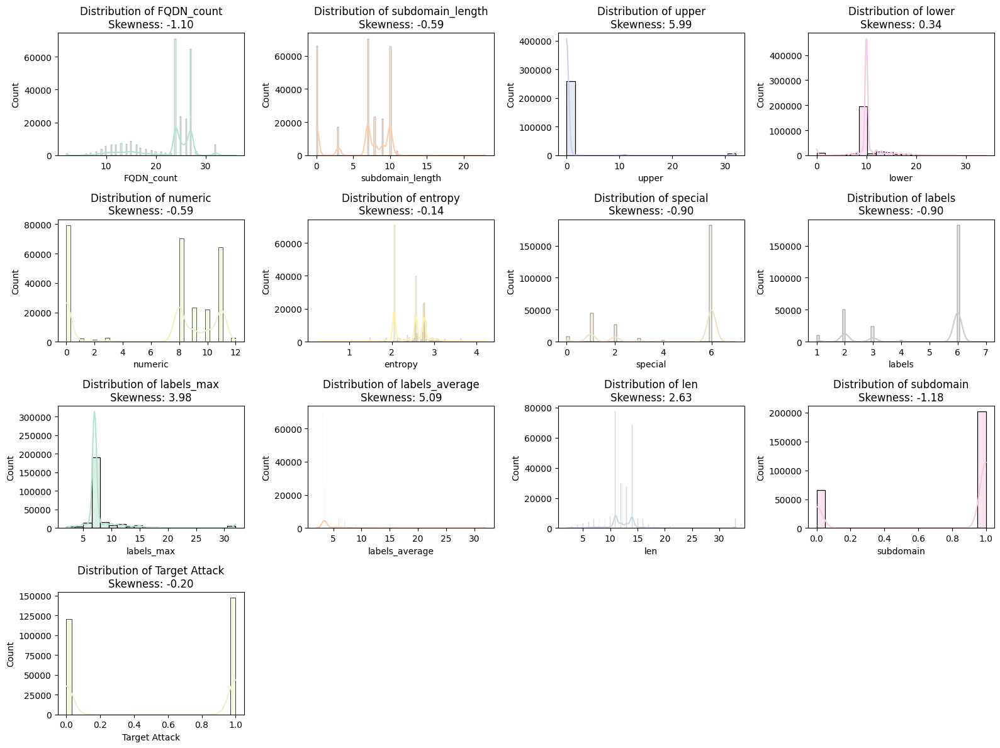

In [9]:
pastel_palette = sns.color_palette('Pastel2')
plt.figure(figsize=(16, 12))

for i, feature in enumerate(numerical_features):
    if i < 13:
        plt.subplot(4, 4, i + 1)
        sns.histplot(data[feature], kde=True, color=pastel_palette[i % len(pastel_palette)])  # Modulo for cycling colors
        skewness = data[feature].skew()
        plt.title(f'Distribution of {feature}\nSkewness: {skewness:.2f}')  # Display skewness in the title

plt.tight_layout()
plt.show()


## QQ plot for Numerical Features

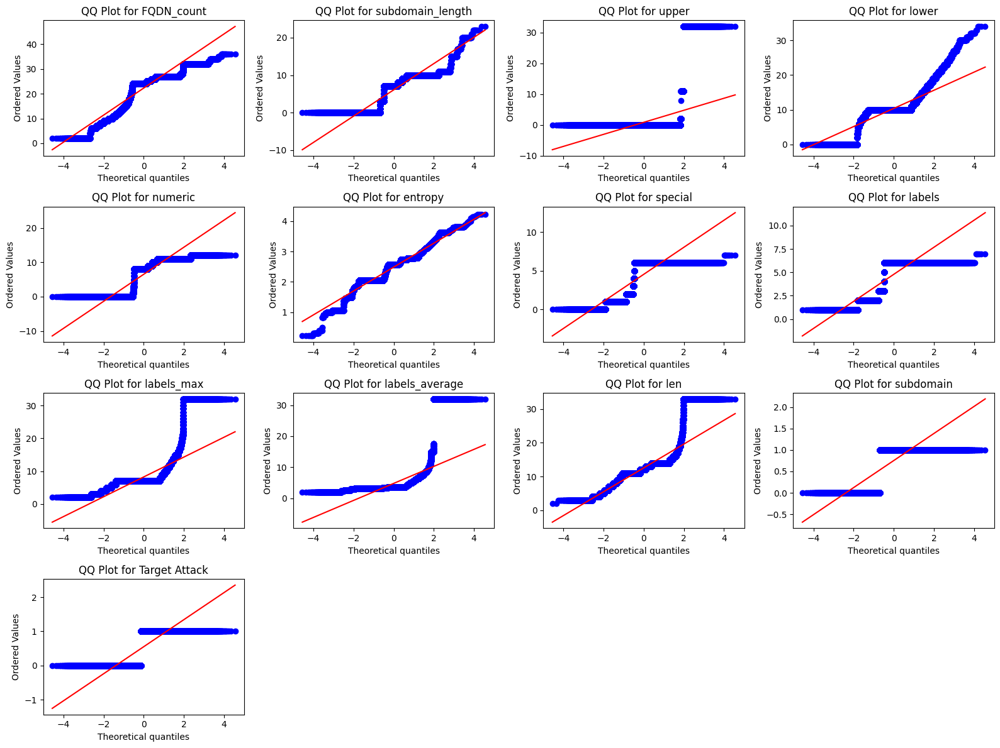

In [10]:
plt.figure(figsize=(16, 12))

# Loop through numerical features and create QQ plots
for i, feature in enumerate(numerical_features):
    if i < 13:
        plt.subplot(4, 4, i + 1)
        stats.probplot(data[feature], dist="norm", plot=plt)
        plt.title(f'QQ Plot for {feature}')

plt.tight_layout()
plt.show()


##Histogram for Numerical Features

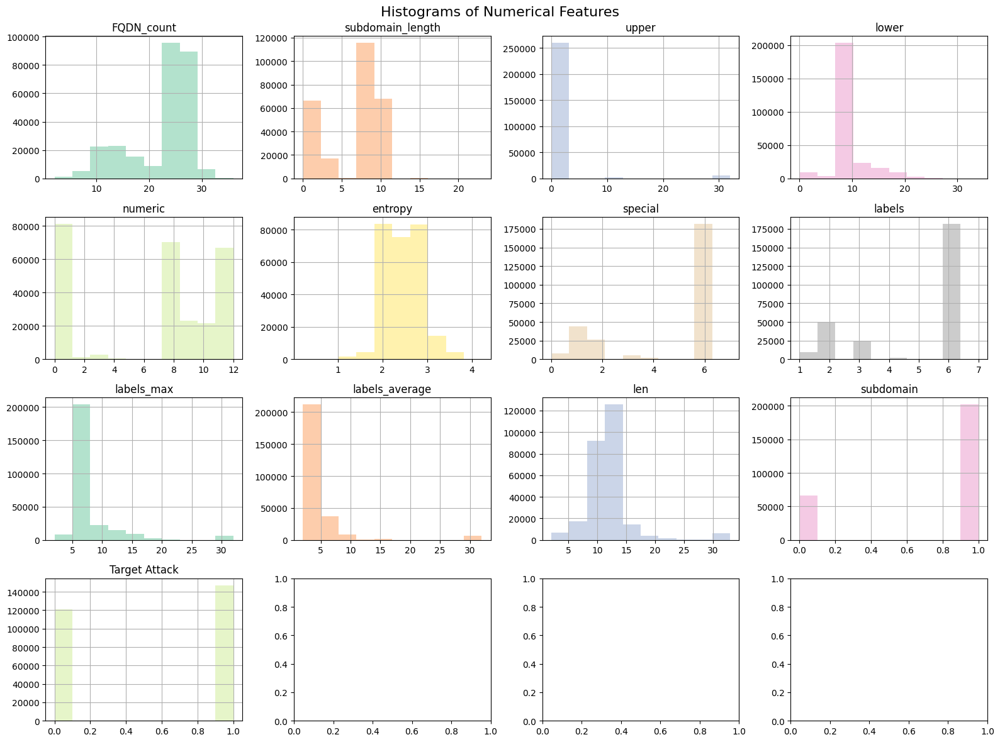

In [11]:
fig, axes = plt.subplots(4, 4, figsize=(16, 12))
axes = axes.flatten()

# Iterate through each numerical feature and create histograms
for i, feature in enumerate(numerical_features):
    data[feature].hist(ax=axes[i], color=pastel_palette[i % len(pastel_palette)])
    axes[i].set_title(feature)

plt.suptitle('Histograms of Numerical Features', fontsize=16)
plt.tight_layout()
plt.show()


##Finding the Outliers

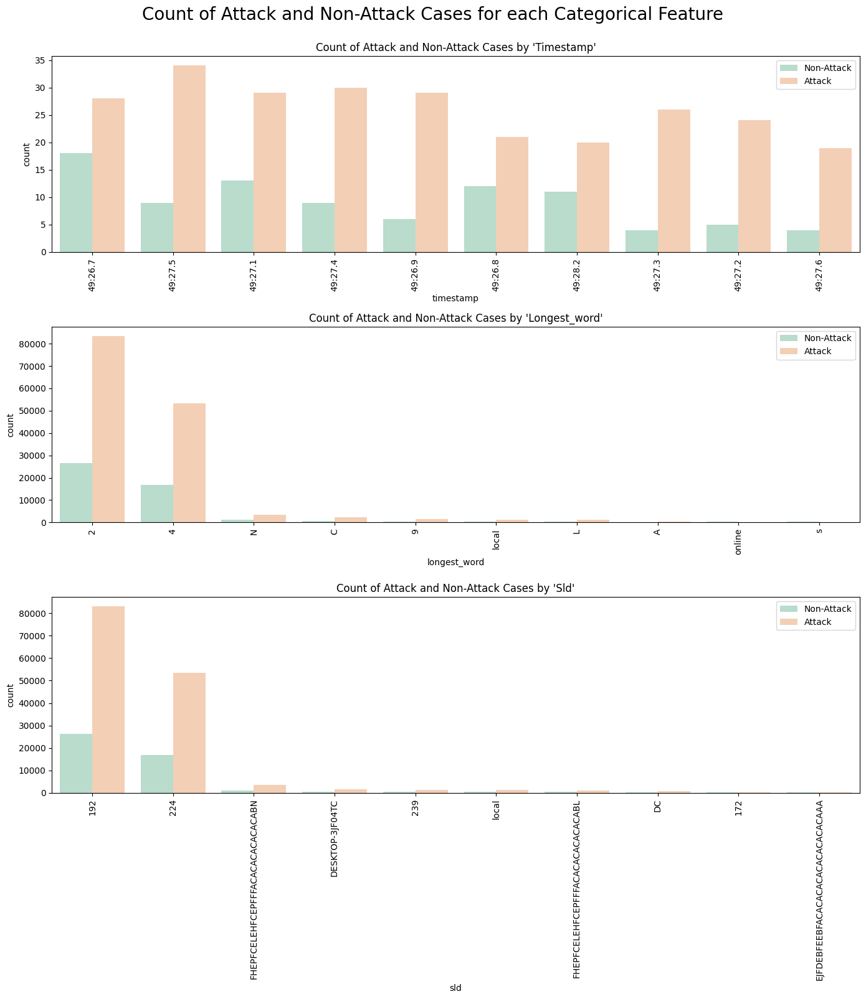

In [12]:
fig, axes = plt.subplots(nrows=3, ncols=1, figsize=(14, 16))
fig.suptitle("Count of Attack and Non-Attack Cases for each Categorical Feature", y=1, size=20)

# List of categorical features and their respective top 10 categories
categorical_features = {
    'timestamp': data["timestamp"].value_counts(sort=True, ascending=False).index[:10],
    'longest_word': data["longest_word"].value_counts(sort=True, ascending=False).index[:10],
    'sld': data["sld"].value_counts(sort=True, ascending=False).index[:10]
}

for i, (feature, top_categories) in enumerate(categorical_features.items()):
    # Plot the count of Attack and Non-Attack cases for each category
    sns.countplot(data=data, x=feature, hue='Target Attack', order=top_categories, palette=pastel_palette, ax=axes[i])
    axes[i].set_title(f"Count of Attack and Non-Attack Cases by '{feature.capitalize()}'")
    axes[i].tick_params(axis='x', rotation=90)
    axes[i].legend(labels=['Non-Attack', 'Attack'])

plt.tight_layout()
plt.show()


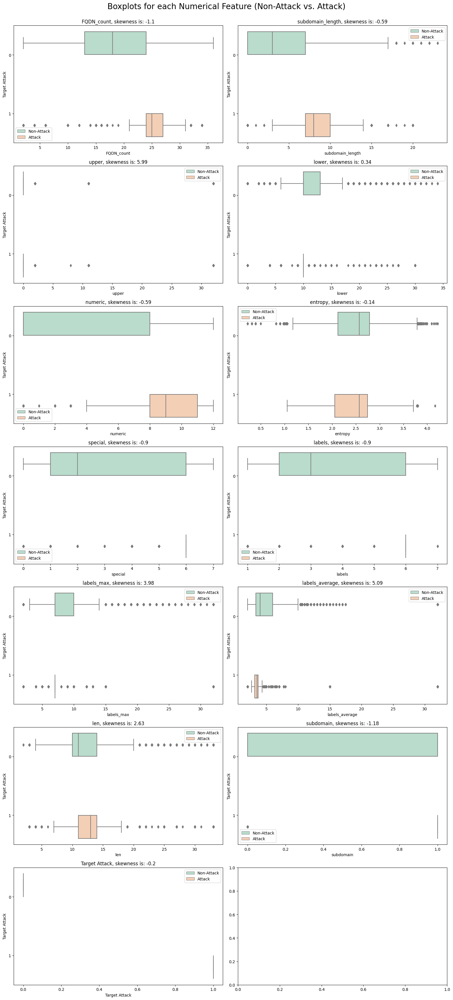

In [13]:
num_features = len(numerical_features)
rows = (num_features + 1) // 2  # Calculate the number of rows necessary

# Set up the subplots
fig, axs = plt.subplots(rows, 2, figsize=(16, 5 * rows))
fig.suptitle('Boxplots for each Numerical Feature (Non-Attack vs. Attack)', y=1, size=20)

# Custom palette for "Non-Attack" (blue) and "Attack" (pink)
attack_palette = {0: pastel_palette[0], 1: pastel_palette[1]}

# Iterate through the numerical features and create boxplots
for i, feature in enumerate(numerical_features):
    if i < num_features:  # Check if the subplot limit is reached
        ax = axs[i // 2, i % 2]  # Adjust for the subplot layout
        sns.boxplot(data=data, x=feature, y='Target Attack', hue='Target Attack', orient='h', ax=ax, palette=attack_palette)  # Boxplot without hue_order
        ax.set_title(feature + ', skewness is: ' + str(round(data[feature].skew(axis=0, skipna=True), 2)))
        handles, _ = ax.get_legend_handles_labels()
        ax.legend(handles, ["Non-Attack", "Attack"])

# Adjust the layout to avoid overlapping titles and labels
plt.tight_layout()
plt.show()


## Balance or Non-Balance?
Number of Attack and Not-Attack Cases

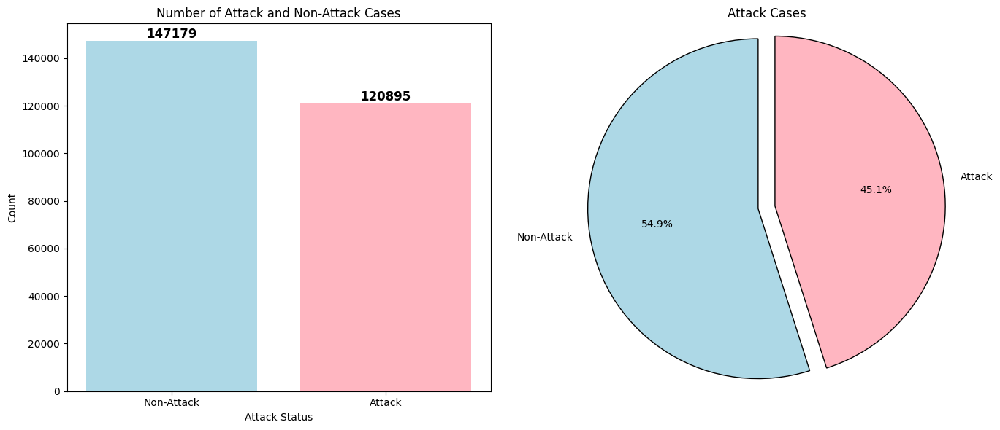

In [14]:
# Count the number of attack cases
attack_counts = data["Target Attack"].value_counts()
attack_labels = attack_counts.index.tolist()
attack_values = attack_counts.tolist()

# Create a figure with one row and two columns for side-by-side plots
fig, axes = plt.subplots(1, 2, figsize=(14, 6))

# Plot the bar chart on the first subplot (axes[0])
axes[0].bar(['Non-Attack', 'Attack'], attack_values, color=['lightblue', 'lightpink'])
for i, v in enumerate(attack_values):
    axes[0].text(i, v, str(v), ha='center', va='bottom', fontweight='bold', fontsize=12)

axes[0].set_title('Number of Attack and Non-Attack Cases')
axes[0].set_xlabel('Attack Status')
axes[0].set_ylabel('Count')

# Create a pie chart on the second subplot (axes[1])
axes[1].pie(attack_values, labels=['Non-Attack', 'Attack'], autopct='%1.1f%%', startangle=90, explode=(0.1, 0), colors=['lightblue', 'lightpink'],
            wedgeprops={'edgecolor': 'black', 'linewidth': 1, 'antialiased': True})
axes[1].set_title('Attack Cases')
axes[1].axis('equal')  # Equal aspect ratio ensures that the pie is drawn as a circle.

# Adjust the layout and display the plots
plt.tight_layout()
plt.show()


#2.Feature engineering and data cleaning

##Analyze the data

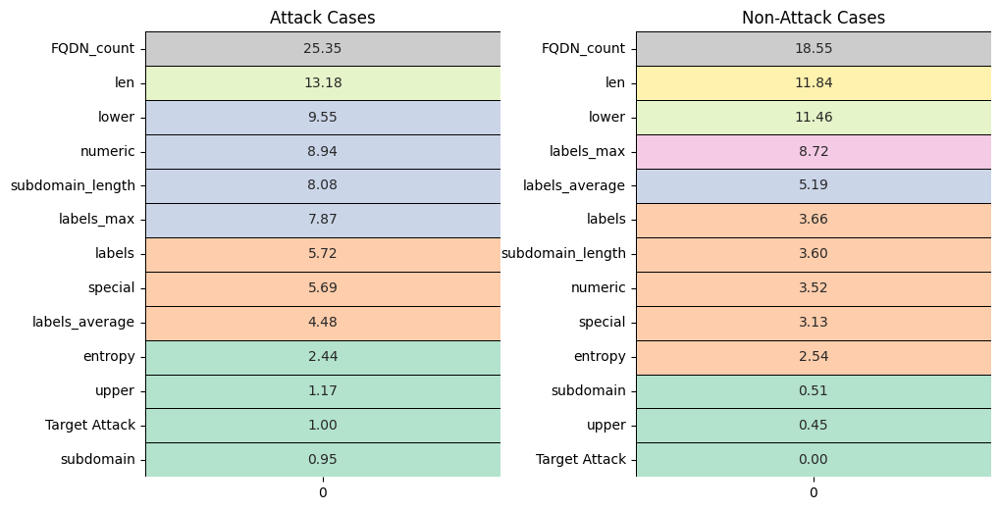

In [15]:
# Sort the mean values in descending order for 'is_attack' = 1 (attack) and 'is_attack' = 0 (non-attack)
attack_mean = data[data['Target Attack'] == 1].mean().sort_values(ascending=False)
non_attack_mean = data[data['Target Attack'] == 0].mean().sort_values(ascending=False)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

# Plot heatmap for 'is_attack' = 1 (attack)
plt.subplot(1, 2, 1)
sns.heatmap(attack_mean.to_frame(), annot=True, cmap='Pastel2', linewidths=0.4, linecolor='black', cbar=False, fmt='.2f')
plt.title('Attack Cases')

plt.subplot(1, 2, 2)
sns.heatmap(non_attack_mean.to_frame(), annot=True, cmap='Pastel2', linewidths=0.4, linecolor='black', cbar=False, fmt='.2f')
plt.title('Non-Attack Cases')
fig.tight_layout(pad=0)
plt.show()


## Correlation Matrix

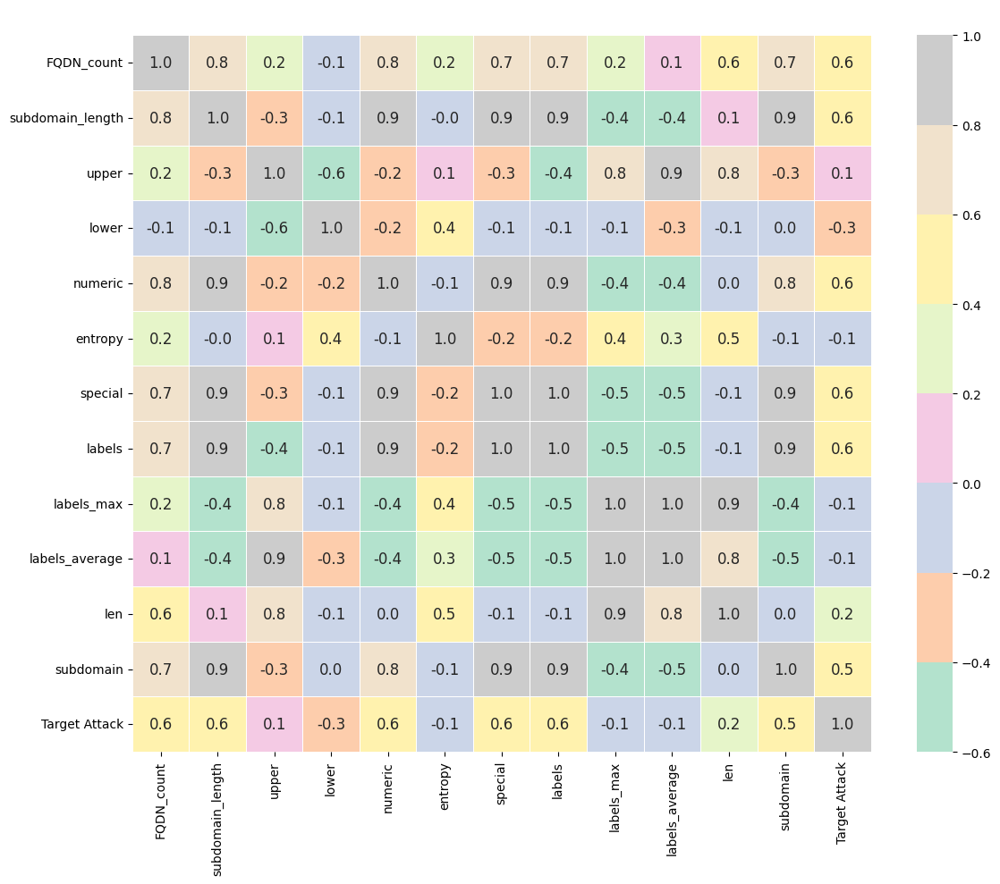

In [16]:
corr = data.corr().round(1)

plt.figure(figsize=(12, 10))
ax=sns.heatmap(corr, annot=True, cmap='Pastel2', fmt='.1f', linewidths=0.5, annot_kws={"size": 12})
plt.title("DNS traffic - Correlation Heatmap", color="white", size=20)
plt.tight_layout()
plt.show()


## Checking for Null values

In [17]:
print("Number of NULL values:\n", data.isnull().sum())

Number of NULL values:
 timestamp           0
FQDN_count          0
subdomain_length    0
upper               0
lower               0
numeric             0
entropy             0
special             0
labels              0
labels_max          0
labels_average      0
longest_word        8
sld                 0
len                 0
subdomain           0
Target Attack       0
dtype: int64


In [18]:
data.dropna(inplace=True)

In [19]:
print("Number of NULL values:\n", data.isnull().sum())

Number of NULL values:
 timestamp           0
FQDN_count          0
subdomain_length    0
upper               0
lower               0
numeric             0
entropy             0
special             0
labels              0
labels_max          0
labels_average      0
longest_word        0
sld                 0
len                 0
subdomain           0
Target Attack       0
dtype: int64


## Checking for Duplicate Rows

In [20]:
print("Number of Duplicate Rows:", data.duplicated().sum())

Number of Duplicate Rows: 91803


In [21]:
data.drop_duplicates(inplace=True)

print("Number of Duplicate Rows after Removal:", data.duplicated().sum())

Number of Duplicate Rows after Removal: 0


## Drop unnecessary features

In [22]:
data = data.drop(columns=['timestamp'])

##Transform the variables that contain string values using an Embedding technique

In [23]:
# Get the names of categorical features
categorical_features = data.select_dtypes(include='object').columns.tolist()
print("Categorical Features:", categorical_features)

Categorical Features: ['longest_word', 'sld']


In [24]:
data['longest_word'].value_counts()

2          64655
4          40968
C           2435
N           1847
9           1190
           ...  
onenote        1
mal            1
oke            1
ecu            1
sph            1
Name: longest_word, Length: 6224, dtype: int64

In [25]:
data['sld'].value_counts()

192                                 64258
224                                 40968
DESKTOP-3JF04TC                      1933
FHEPFCELEHFCEPFFFACACACACACACABN     1847
239                                  1190
                                    ...  
lahemal                                 1
ecu                                     1
sph                                     1
magickjewelry                           1
secureserver                            1
Name: sld, Length: 11110, dtype: int64

###Embedding


In [26]:
original_values_df = pd.DataFrame({
    'longest_word_original': data['longest_word'],
    'sld_original': data['sld']
})

# Find the most frequent values (modes) for the 'longest_word' and 'sld' columns.
longest_word_mode_str = data["longest_word"].mode()[0]
sld_mode_v = int(data["sld"].mode()[0])

# Establish dictionaries to map unique categorical values to numerical indices.
longest_word_embedding = {value: i for i, value in enumerate(data['longest_word'].unique())}
sld_embedding = {value: i for i, value in enumerate(data['sld'].unique())}

#Substitute the original categorical values in 'longest_word' and 'sld' columns with their corresponding numerical indices.
data['longest_word'] = data['longest_word'].apply(lambda x: longest_word_embedding.get(x, longest_word_mode_str))
data['sld'] = data['sld'].apply(lambda x: sld_embedding.get(x, sld_mode_v)).astype(int)

# Create a new DataFrame with original and embedded values
embedded_values_df = pd.DataFrame({
    'longest_word_original': original_values_df['longest_word_original'],
    'longest_word_embedded': data['longest_word'],
    'sld_original': original_values_df['sld_original'],
    'sld_embedded': data['sld']
})

In [27]:
embedded_values_df

,longest_word_original,longest_word_embedded,sld_original,sld_embedded
0,2,0,192,0
1,2,0,192,0
2,2,0,192,0
3,2,0,192,0
4,local,1,local,1
...,...,...,...,...
268064,4,3,224,3
268066,2,0,192,0
268068,gek,3569,gek,5194
268070,2,0,192,0


In [28]:
data

,FQDN_count,subdomain_length,upper,lower,numeric,entropy,special,labels,labels_max,labels_average,longest_word,sld,len,subdomain,Target Attack
0,27,10,0,10,11,2.570417,6,6,7,3.666667,0,0,14,1,1
1,27,10,0,10,11,2.767195,6,6,7,3.666667,0,0,14,1,1
2,26,9,0,10,10,2.742338,6,6,7,3.500000,0,0,13,1,0
3,27,10,0,10,11,2.570417,6,6,7,3.666667,0,0,14,1,1
4,15,9,0,11,0,2.929439,4,3,5,4.333333,1,1,15,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
268064,24,7,0,10,8,2.054029,6,6,7,3.166667,3,3,11,1,0
268066,27,10,0,10,11,2.570417,6,6,7,3.666667,0,0,14,1,0
268068,12,5,0,10,0,2.817711,2,3,5,3.333333,3569,5194,9,1,0
268070,27,10,0,10,11,2.767195,6,6,7,3.666667,0,0,14,1,0


In [29]:
data['longest_word'].value_counts()

0       64655
3       40968
43       2435
10       1847
132      1190
        ...  
6212        1
5644        1
1794        1
6178        1
5994        1
Name: longest_word, Length: 6224, dtype: int64

In [30]:
data['sld'].value_counts()

0        64258
3        40968
43        1933
10        1847
133       1190
         ...  
9680         1
11004        1
10564        1
10063        1
10796        1
Name: sld, Length: 11110, dtype: int64

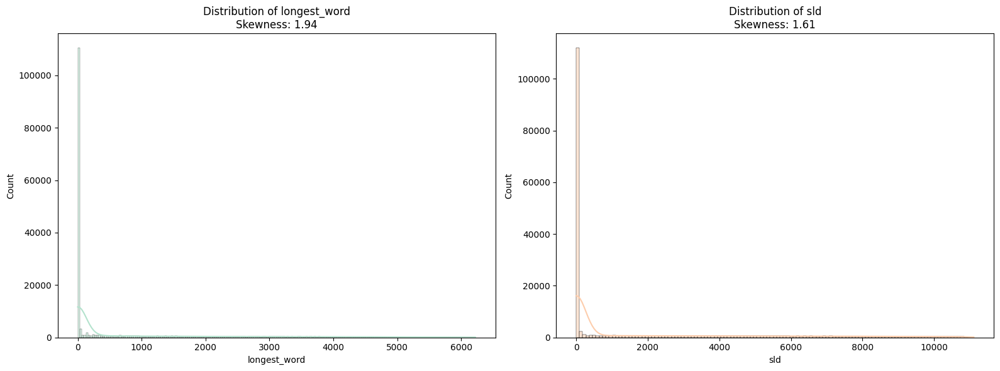

In [31]:
plt.figure(figsize=(16, 6))  # Adjusted figure size for two subplots

for i, feature in enumerate(['longest_word', 'sld']):
    plt.subplot(1, 2, i + 1)  # 1 row, 2 columns for the two features
    sns.histplot(data[feature], kde=True, color=pastel_palette[i % len(pastel_palette)])  # Modulo for cycling colors
    skewness = data[feature].skew()
    plt.title(f'Distribution of {feature}\nSkewness: {skewness:.2f}')  # Display skewness in the title

plt.tight_layout()
plt.show()


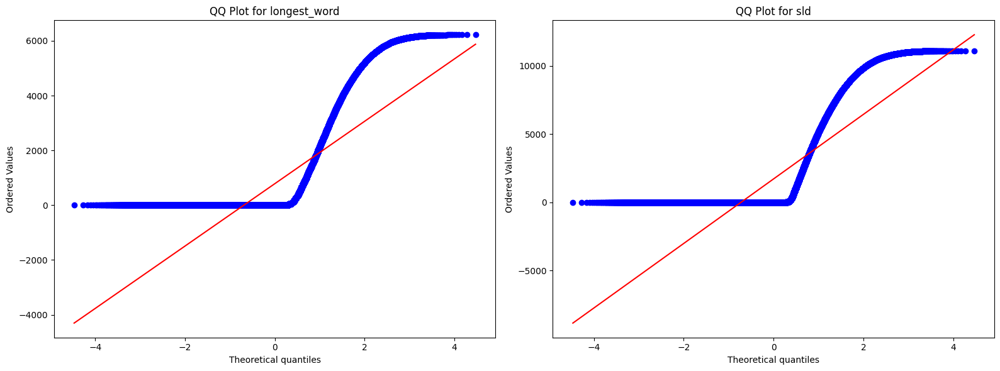

In [32]:
plt.figure(figsize=(16, 6))  # Adjusted figure size for two subplots

for i, feature in enumerate(['longest_word', 'sld']):
    plt.subplot(1, 2, i + 1)  # 1 row, 2 columns for the two features
    stats.probplot(data[feature], dist="norm", plot=plt)
    plt.title(f'QQ Plot for {feature}')

plt.tight_layout()
plt.show()

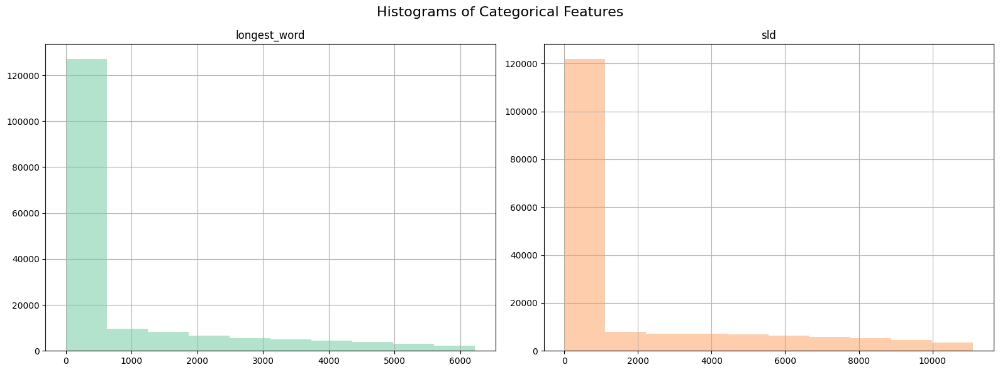

In [33]:
fig, axes = plt.subplots(1, 2, figsize=(16, 6))  # 1 row, 2 columns for the two features

# Iterate through each feature and create histograms
for i, feature in enumerate(['longest_word', 'sld']):
    data[feature].hist(ax=axes[i], color=pastel_palette[i % len(pastel_palette)])
    axes[i].set_title(feature)

plt.suptitle('Histograms of Categorical Features', fontsize=16)
plt.tight_layout()
plt.show()


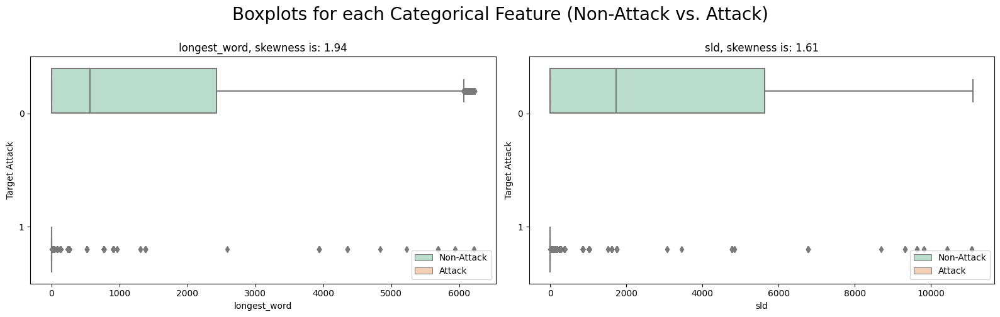

In [34]:
num_features = 2
fig, axs = plt.subplots(1, num_features, figsize=(16, 5))

fig.suptitle('Boxplots for each Categorical Feature (Non-Attack vs. Attack)', y=1, size=20)

categorical_features = ['longest_word', 'sld']  # Specify the categorical features

attack_palette = {0: pastel_palette[0], 1: pastel_palette[1]}

for i, feature in enumerate(categorical_features):
    ax = axs[i]  # Adjust for the subplot layout
    sns.boxplot(data=data, x=feature, y='Target Attack', hue='Target Attack', orient='h', ax=ax, palette=attack_palette)
    ax.set_title(feature + ', skewness is: ' + str(round(data[feature].skew(axis=0, skipna=True), 2)))
    handles, _ = ax.get_legend_handles_labels()
    ax.legend(handles, ["Non-Attack", "Attack"])

plt.tight_layout()
plt.show()


In [35]:
X = data.drop(columns=['Target Attack'], axis=1)
y = data['Target Attack']

print("Shape of X:", X.shape)
print("Shape of y:", y.shape)

Shape of X: (176263, 14)
Shape of y: (176263,)


#3.Feature Filtering/Selection


In [36]:
def Feature_Selection(selected_feature_names, feature_scores,Name,label):
  # Sort the features based on Mutual Information scores in descending order
    sorted_features = sorted(zip(selected_feature_names, feature_scores), key=lambda x: x[1], reverse=True)
    sorted_feature_names, sorted_feature_scores = zip(*sorted_features)

    # Create a DataFrame for visualization
    top_feature_df = pd.DataFrame({'Feature': sorted_feature_names, 'Score': sorted_feature_scores})

    # Use the "Spectral" color palette
    colors = sns.color_palette("Spectral", n_colors=len(top_feature_df))

    # Plot the top features
    plt.figure(figsize=(10, 6))
    bars = plt.barh(top_feature_df['Feature'], top_feature_df['Score'], color=colors)
    plt.xlabel(label)
    plt.title(f'Top {len(top_feature_df)} Most Important Features using {Name}')

    plt.gca().invert_yaxis()  # Invert y-axis to start from the highest score
    plt.show()

    return top_feature_df


## Mutual Information Feature Selection

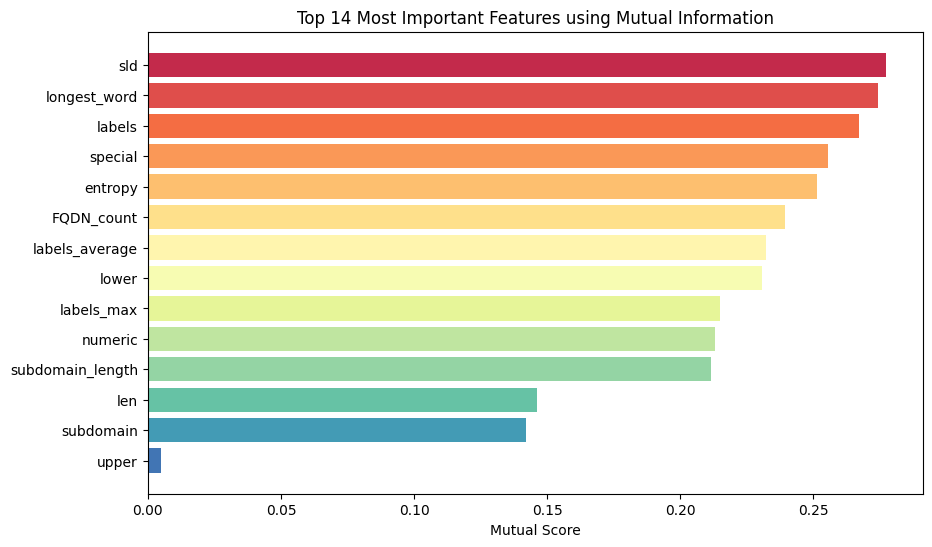

,Feature,Score
0,sld,0.277245
1,longest_word,0.274441
2,labels,0.267029
3,special,0.255316
4,entropy,0.251506
5,FQDN_count,0.239153
6,labels_average,0.232088
7,lower,0.230643
8,labels_max,0.214979
9,numeric,0.212957


In [37]:
# Calculate Mutual Information scores
# Select the top k features based on Mutual Information scores
k_best = SelectKBest(mutual_info_classif, k='all')
k_best.fit(X, y)
feature_scores = k_best.scores_
selected_feature_names = X.columns[k_best.get_support()]

MI_top_feature_df= Feature_Selection(selected_feature_names, feature_scores,'Mutual Information','Mutual Score')
MI_top_feature_df

##Feature Selection using ANOVA

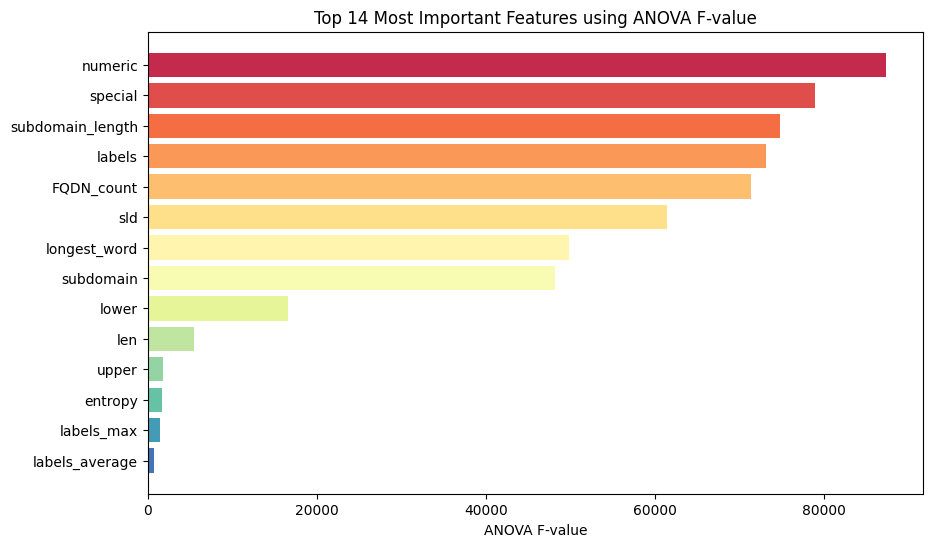

,Feature,Score
0,numeric,87389.445842
1,special,78960.533812
2,subdomain_length,74797.474537
3,labels,73244.440062
4,FQDN_count,71373.781290
5,sld,61521.202751
6,longest_word,49873.297847
7,subdomain,48238.416671
8,lower,16587.534683
9,len,5482.387112


In [38]:
# Select the top k features based on ANOVA F-values
k_best = SelectKBest(f_classif, k='all')
k_best.fit(X, y)
feature_scores = k_best.scores_
selected_feature_names = X.columns[k_best.get_support()]

ANOVA_top_feature_df= Feature_Selection(selected_feature_names, feature_scores,'ANOVA F-value','ANOVA F-value')
ANOVA_top_feature_df

##Chi Square Featuer Selection

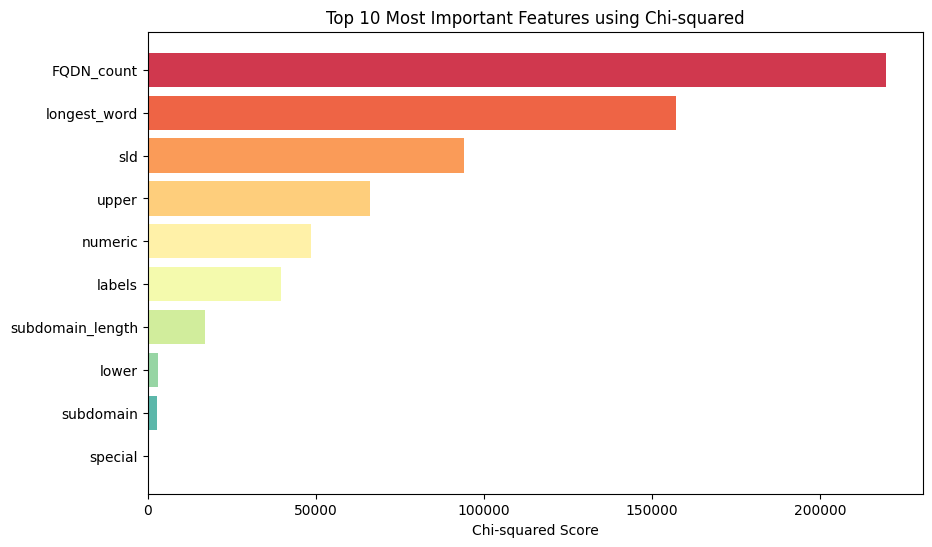

,Feature,Chi-squared Score
4,FQDN_count,219589.068396
1,longest_word,157019.832683
0,sld,94197.451983
6,upper,66221.906544
2,numeric,48529.293209
7,labels,39760.778389
3,subdomain_length,16876.224994
8,lower,2929.134963
9,subdomain,2737.660757
5,special,119.712513


In [39]:
# Select the top k features based on chi2 scores
k_best = SelectKBest(chi2, k='all')
k_best.fit(X, y)
chi2_scores = k_best.scores_
selected_feature_names = X.columns[k_best.get_support()]

sorted_feature_names = [x for _, x in sorted(zip(chi2_scores, selected_feature_names), reverse=True)]

# Plot the top features
num_features_to_plot = 10
top_feature_names = sorted_feature_names[:num_features_to_plot]
top_chi2_scores = chi2_scores[k_best.get_support()][:num_features_to_plot]

# Use the "Spectral" color palette
colors = sns.color_palette("Spectral", n_colors=len(top_feature_names))
chi2_df = pd.DataFrame({'Feature': top_feature_names, 'Chi-squared Score': top_chi2_scores})

# Sort the DataFrame by Chi-squared Score in descending order
chi2_df = chi2_df.sort_values(by='Chi-squared Score', ascending=False)

# Plot the sorted top features
plt.figure(figsize=(10, 6))
bars = plt.barh(chi2_df['Feature'], chi2_df['Chi-squared Score'], color=colors)
plt.xlabel('Chi-squared Score')
plt.title('Top {} Most Important Features using Chi-squared'.format(num_features_to_plot))
plt.gca().invert_yaxis()  # Invert y-axis to start from the highest score
plt.show()
chi2_df

## Recursive Feature  Elimination (RFE)




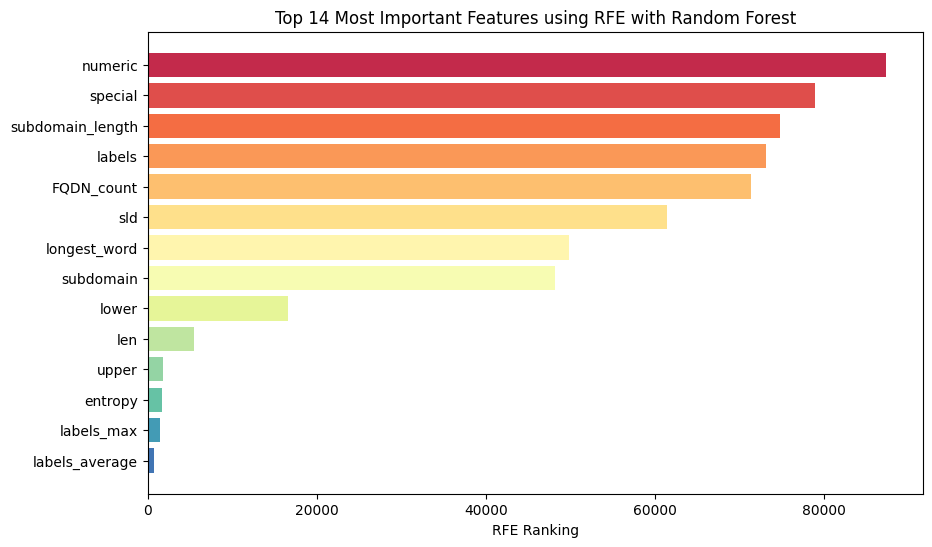

,Feature,Score
0,numeric,87389.445842
1,special,78960.533812
2,subdomain_length,74797.474537
3,labels,73244.440062
4,FQDN_count,71373.781290
5,sld,61521.202751
6,longest_word,49873.297847
7,subdomain,48238.416671
8,lower,16587.534683
9,len,5482.387112


In [40]:
# Initialize the Random Forest classifier
rf_classifier = RandomForestClassifier(random_state=42)
rfe = RFE(rf_classifier, n_features_to_select=1)

fit = rfe.fit(X, y)
rfe_ranking = fit.ranking_    # Get the ranking of each feature

# Sort the features based on RFE ranking in descending order
sorted_features = sorted(zip(X.columns, rfe_ranking), key=lambda x: x[1], reverse=True)
sorted_feature_names, sorted_rfe_ranking = zip(*sorted_features)

RFE_top_feature_df= Feature_Selection(selected_feature_names, feature_scores,'RFE with Random Forest','RFE Ranking')
RFE_top_feature_df


#4.Model Training

##Splitting

In [41]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [42]:
len(X_train)


141010

In [43]:
len(X_test)


35253

##Normalization

In [44]:
# Initialize the StandardScaler
scaler = StandardScaler()

# Fit the scaler on the training data and transform both the training and testing data
X_train = scaler.fit_transform(X_train)
X_test= scaler.transform(X_test)

In [45]:
def evaluate_model(X_train, test_X, train_Y, test_Y, range_values, model):
    f1_values = []
    recall_values = []
    accuracy_values = []
    precision_values = []

    for i in range_values:
        model.fit(X_train, train_Y)
        y_pred = model.predict(test_X)
        f1 = f1_score(test_Y, y_pred) * 100
        recall = recall_score(test_Y, y_pred) * 100
        accuracy = accuracy_score(test_Y, y_pred) * 100
        precision = precision_score(test_Y, y_pred) * 100

        # Append the scores for each iteration
        f1_values.append(f1)
        recall_values.append(recall)
        accuracy_values.append(accuracy)
        precision_values.append(precision)

    return f1_values, recall_values, accuracy_values, precision_values

In [46]:
def Filter_Selection(X_train, X_test, y_train, y_test, fm, fm_name, range_values, model):
    best_i_accuracy, best_accuracy = None, 0
    best_i_f1, best_f1_score = None, 0
    best_i_recall, best_recall = None, 0
    best_i_precision, best_precision = None, 0

    scores_dict = {
        'F1 Score': [],
        'Recall': [],
        'Accuracy': [],
        'Precision': [],
        'Selected Features': []
    }

    for i in range_values:
        if fm_name == 'ANOVA':
            fsm = SelectKBest(f_classif, k=i)
        elif fm_name == 'Chi2':
            fsm = SelectKBest(chi2, k=i)
        elif fm_name == 'RFE':
            fsm = RFE(estimator=model, n_features_to_select=i)
        else:
            fsm = SelectKBest(fm, k=i)


        fsm.fit(X_train, y_train)
        selected_features = fsm.get_support(indices=True)  # Get indices of selected features

        scores_dict['Selected Features'].append(selected_features)

        X_train_fs = X_train[:, selected_features]
        X_test_fs = X_test[:, selected_features]

        f1_values, recall_values, accuracy_values, precision_values = evaluate_model(X_train_fs, X_test_fs, y_train, y_test, range_values, model)

        scores_dict['F1 Score'].append(max(f1_values))
        scores_dict['Recall'].append(max(recall_values))
        scores_dict['Accuracy'].append(max(accuracy_values))
        scores_dict['Precision'].append(max(precision_values))

        # Check if the current metrics are better than the previous best for each metric
        if max(accuracy_values) > best_accuracy:
            best_accuracy = max(accuracy_values)
            best_i_accuracy = i

        if max(f1_values) > best_f1_score:
            best_f1_score = max(f1_values)
            best_i_f1 = i

        if max(recall_values) > best_recall:
            best_recall = max(recall_values)
            best_i_recall = i

        if max(precision_values) > best_precision:
            best_precision = max(precision_values)
            best_i_precision = i

    return {
        'best_i_accuracy': best_i_accuracy,
        'best_i_f1': best_i_f1,
        'best_i_recall': best_i_recall,
        'best_i_precision': best_i_precision,
        'best_accuracy': best_accuracy,
        'best_f1_score': best_f1_score,
        'best_recall': best_recall,
        'best_precision': best_precision,
        'scores_dict': scores_dict
    }


In [47]:
range_values = list(range(6, 13))

In [48]:
def draw_metric_plots(baseline_scores, filter_scores, model_name, range_values, filter_name):
    metrics = ['F1 Score', 'Recall', 'Accuracy', 'Precision']

    fig, axes = plt.subplots(1, 4, figsize=(20, 5))
    fig.suptitle(f'{model_name} - {filter_name}', fontsize=16)

    for i, metric_name in enumerate(metrics):
        # Plot baseline (yellow line)
        axes[i].plot(range_values, baseline_scores[i], label='Baseline', linestyle='--', color='y')

        if filter_name == 'Recursive Feature Elimination (RFE) Feature Selection':
            # Plot performance after applying feature selection (purple line)
            axes[i].plot(range_values, filter_scores[i], 'bx-', label='RCA', color='Purple')
        else:
            # Plot performance after applying feature selection (purple line)
            axes[i].plot(range_values, filter_scores[i], 'bx-', label=f'{filter_name}', color='Purple')

        # Set labels and formatting
        axes[i].set_xlabel('Number of Features')
        axes[i].set_ylabel(metric_name)
        axes[i].set_xticks(range_values)  # Set x-axis ticks
        axes[i].set_ylim([60, 100])  # Set y-axis range from 60% to 100%
        axes[i].set_yticklabels([f'{int(val)}%' for val in axes[i].get_yticks()])  # Set y-axis labels as percentages
        axes[i].set_title(f'{model_name} - {metric_name}')
        axes[i].legend(loc='lower right')  # Display legend
        axes[i].grid(True, linestyle='--', alpha=0.7)  # Add grid with dashed lines

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()


##Random Forest Model

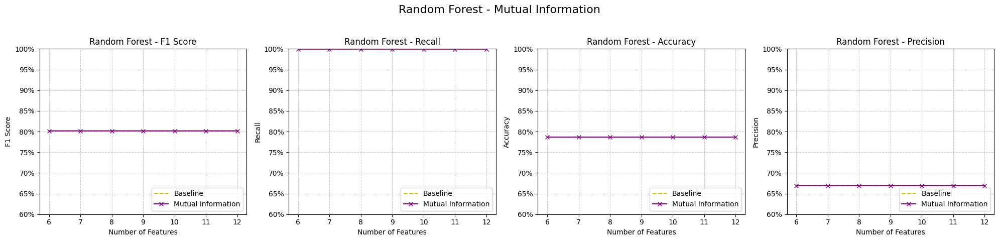

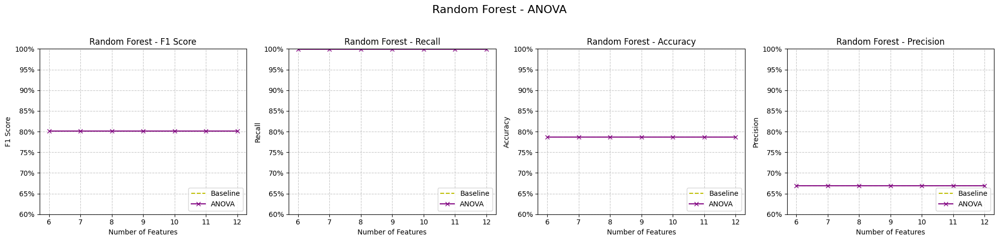

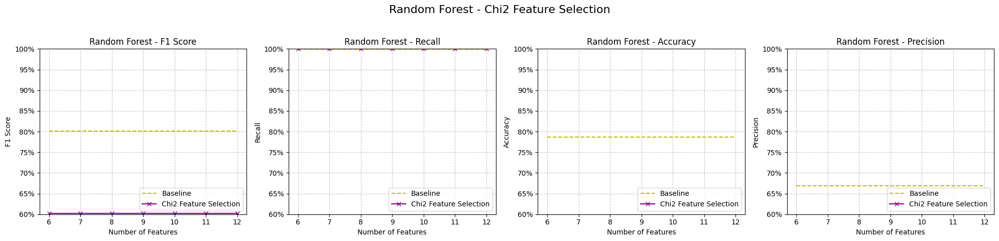

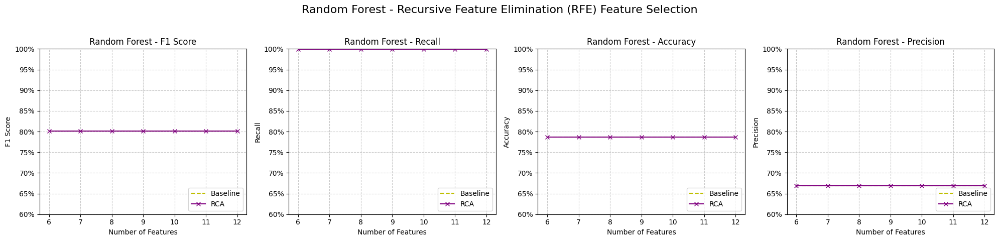

In [49]:
# Model 1: Random Forest
model_name_RF = "Random Forest"
model = RandomForestClassifier(random_state=42)

# Baseline
RF_baseline_f1, RF_baseline_recall, RF_baseline_accuracy, RF_baseline_precision = evaluate_model(X_train, X_test, y_train, y_test, range_values, model)

# Mutual Information Feature Selection
RF_mi_fs = Filter_Selection(X_train, X_test, y_train, y_test, mutual_info_classif, 'Mutual Information', range_values, model)
draw_metric_plots([RF_baseline_f1, RF_baseline_recall, RF_baseline_accuracy, RF_baseline_precision],
                 [RF_mi_fs['scores_dict']['F1 Score'], RF_mi_fs['scores_dict']['Recall'],
                  RF_mi_fs['scores_dict']['Accuracy'], RF_mi_fs['scores_dict']['Precision']],
                 model_name_RF, range_values, 'Mutual Information')

# Feature Selection using ANOVA
RF_anova_fs = Filter_Selection(X_train, X_test, y_train, y_test, f_classif, 'ANOVA', range_values, model)
draw_metric_plots([RF_baseline_f1, RF_baseline_recall, RF_baseline_accuracy, RF_baseline_precision],
                 [RF_anova_fs['scores_dict']['F1 Score'], RF_anova_fs['scores_dict']['Recall'],
                  RF_anova_fs['scores_dict']['Accuracy'], RF_anova_fs['scores_dict']['Precision']],
                 model_name_RF, range_values, 'ANOVA')

# Feature Selection using Chi2
RF_Chi2_fs = Filter_Selection(X_train - np.min(X_train) + 1, X_test, y_train, y_test, chi2, 'Chi2', range_values, model)
draw_metric_plots([RF_baseline_f1, RF_baseline_recall, RF_baseline_accuracy, RF_baseline_precision],
                 [RF_Chi2_fs['scores_dict']['F1 Score'], RF_Chi2_fs['scores_dict']['Recall'],
                  RF_Chi2_fs['scores_dict']['Accuracy'], RF_Chi2_fs['scores_dict']['Precision']],
                 model_name_RF, range_values, 'Chi2 Feature Selection')

# RFE Feature Selection using Random Forest
LR_RFE_fs = Filter_Selection(X_train, X_test, y_train, y_test, RFE(estimator=RandomForestClassifier(), n_features_to_select=i), 'RFE' , range_values, model)
draw_metric_plots([RF_baseline_f1, RF_baseline_recall, RF_baseline_accuracy, RF_baseline_precision],
                  [LR_RFE_fs['scores_dict']['F1 Score'], LR_RFE_fs['scores_dict']['Recall'],
                   LR_RFE_fs['scores_dict']['Accuracy'], LR_RFE_fs['scores_dict']['Precision']],
                  model_name_RF, range_values, 'Recursive Feature Elimination (RFE) Feature Selection')


##Logistic Regression Model

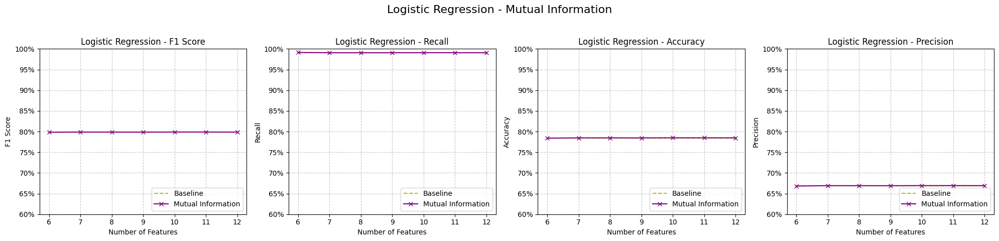

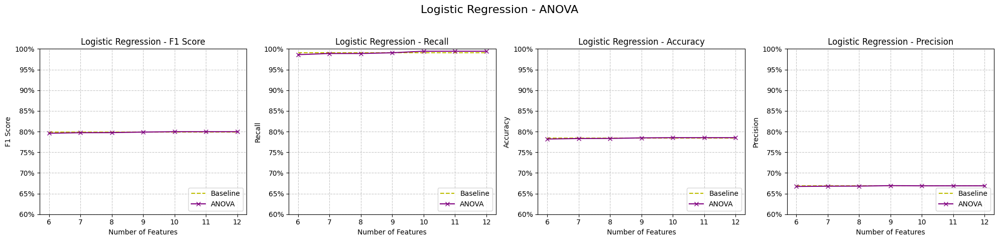

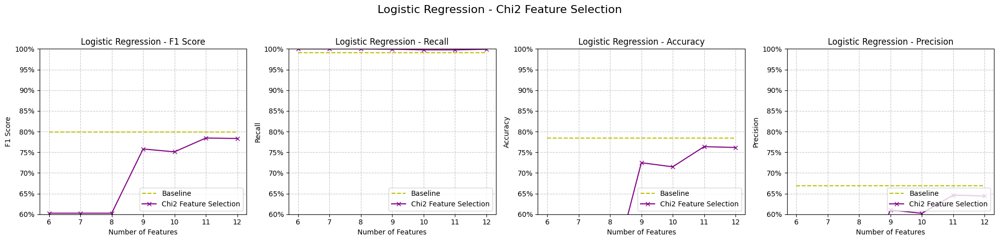

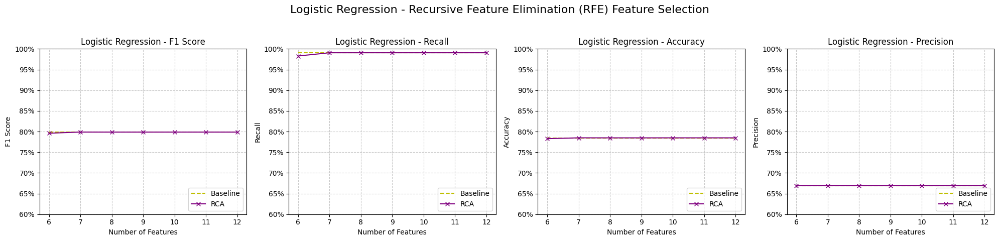

In [50]:
# Model 2: Logistic Regression
model_name_lr = "Logistic Regression"
model_lr = LogisticRegression(random_state=42)

# # Baseline
LR_baseline_f1, LR_baseline_recall, LR_baseline_accuracy, LR_baseline_precision = evaluate_model(X_train, X_test, y_train, y_test, range_values, model_lr)

# Mutual Information Feature Selection
LR_mi_fs = Filter_Selection(X_train, X_test, y_train, y_test, mutual_info_classif, 'Mutual Information', range_values, model_lr)
draw_metric_plots([LR_baseline_f1, LR_baseline_recall, LR_baseline_accuracy, LR_baseline_precision],
                  [LR_mi_fs['scores_dict']['F1 Score'], LR_mi_fs['scores_dict']['Recall'], LR_mi_fs['scores_dict']['Accuracy'], LR_mi_fs['scores_dict']['Precision']],
                  model_name_lr, range_values, 'Mutual Information')

# Feature Selection using ANOVA
LR_anova_fs = Filter_Selection(X_train, X_test, y_train, y_test, f_classif, 'ANOVA', range_values, model_lr)
draw_metric_plots([LR_baseline_f1, LR_baseline_recall, LR_baseline_accuracy, LR_baseline_precision],
                  [LR_anova_fs['scores_dict']['F1 Score'], LR_anova_fs['scores_dict']['Recall'], LR_anova_fs['scores_dict']['Accuracy'], LR_anova_fs['scores_dict']['Precision']],
                  model_name_lr, range_values, 'ANOVA')

# Feature Selection using Chi2
LR_Chi2_fs = Filter_Selection(X_train - np.min(X_train) + 1, X_test, y_train, y_test, chi2, 'Chi2', range_values, model_lr)
draw_metric_plots([LR_baseline_f1, LR_baseline_recall, LR_baseline_accuracy, LR_baseline_precision],
                  [LR_Chi2_fs['scores_dict']['F1 Score'], LR_Chi2_fs['scores_dict']['Recall'], LR_Chi2_fs['scores_dict']['Accuracy'], LR_Chi2_fs['scores_dict']['Precision']],
                  model_name_lr, range_values, 'Chi2 Feature Selection')

# RFE Feature Selection
LR_RFE_fs = Filter_Selection(X_train, X_test, y_train, y_test, RFE(estimator=model_lr, n_features_to_select=i), 'RFE', range_values, model_lr)
draw_metric_plots([LR_baseline_f1, LR_baseline_recall, LR_baseline_accuracy, LR_baseline_precision],
                  [LR_RFE_fs['scores_dict']['F1 Score'], LR_RFE_fs['scores_dict']['Recall'], LR_RFE_fs['scores_dict']['Accuracy'], LR_RFE_fs['scores_dict']['Precision']],
                  model_name_lr, range_values,  'Recursive Feature Elimination (RFE) Feature Selection')

##Xgboost Model

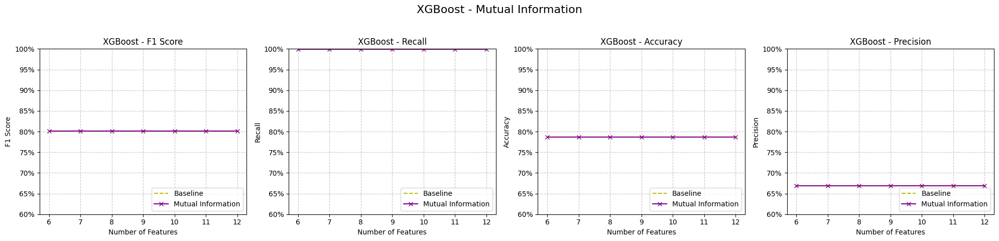

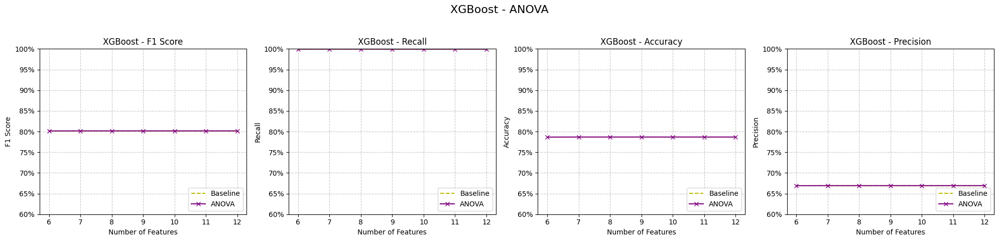

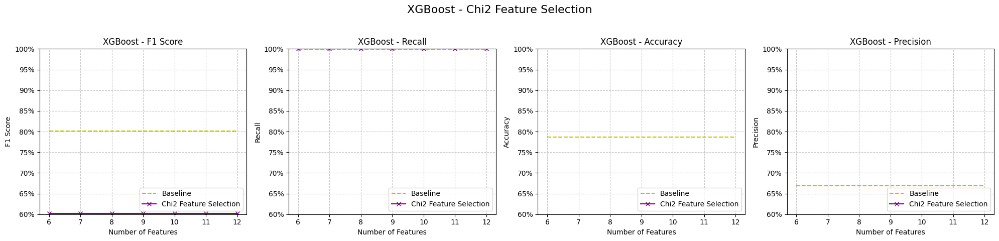

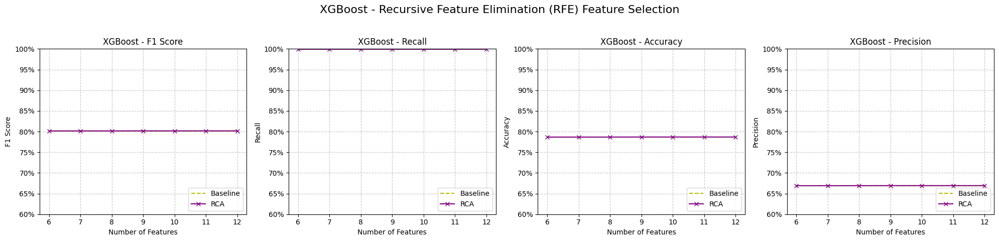

In [51]:
# Model 3: XGBoost
model_name_xgb = "XGBoost"
model_xgb = XGBClassifier(random_state=42)

# Baseline
XGB_baseline_f1, XGB_baseline_recall, XGB_baseline_accuracy, XGB_baseline_precision = evaluate_model(X_train, X_test, y_train, y_test, range_values, model_xgb)

# Mutual Information Feature Selection
XGB_mi_fs = Filter_Selection(X_train, X_test, y_train, y_test, mutual_info_classif, 'Mutual Information', range_values, model_xgb)
draw_metric_plots([XGB_baseline_f1, XGB_baseline_recall, XGB_baseline_accuracy, XGB_baseline_precision],
                  [XGB_mi_fs['scores_dict']['F1 Score'], XGB_mi_fs['scores_dict']['Recall'], XGB_mi_fs['scores_dict']['Accuracy'], XGB_mi_fs['scores_dict']['Precision']],
                  model_name_xgb, range_values, 'Mutual Information')

# Feature Selection using ANOVA
XGB_anova_fs = Filter_Selection(X_train, X_test, y_train, y_test, f_classif, 'ANOVA', range_values, model_xgb)
draw_metric_plots([XGB_baseline_f1, XGB_baseline_recall, XGB_baseline_accuracy, XGB_baseline_precision],
                  [XGB_anova_fs['scores_dict']['F1 Score'], XGB_anova_fs['scores_dict']['Recall'], XGB_anova_fs['scores_dict']['Accuracy'], XGB_anova_fs['scores_dict']['Precision']],
                  model_name_xgb, range_values, 'ANOVA')

# Feature Selection using Chi2
XGB_Chi2_fs = Filter_Selection(X_train - np.min(X_train) + 1, X_test, y_train, y_test, chi2, 'Chi2', range_values, model_xgb)
draw_metric_plots([XGB_baseline_f1, XGB_baseline_recall, XGB_baseline_accuracy, XGB_baseline_precision],
                  [XGB_Chi2_fs['scores_dict']['F1 Score'], XGB_Chi2_fs['scores_dict']['Recall'], XGB_Chi2_fs['scores_dict']['Accuracy'], XGB_Chi2_fs['scores_dict']['Precision']],
                  model_name_xgb, range_values, 'Chi2 Feature Selection')


# RFE Feature Selection using XGBoost
XGB_RFE_fs = Filter_Selection(X_train, X_test, y_train, y_test, RFE(estimator=model_lr, n_features_to_select=i), 'RFE', range_values, model_xgb)
draw_metric_plots([XGB_baseline_f1, XGB_baseline_recall, XGB_baseline_accuracy, XGB_baseline_precision],
                  [XGB_RFE_fs['scores_dict']['F1 Score'], XGB_RFE_fs['scores_dict']['Recall'], XGB_RFE_fs['scores_dict']['Accuracy'], XGB_RFE_fs['scores_dict']['Precision']],
                  model_name_xgb, range_values, 'Recursive Feature Elimination (RFE) Feature Selection')


##Best Feature Selection based on F1 Scores

In [52]:
df = {
    'Random Forest Model': [RF_mi_fs['best_f1_score'], RF_anova_fs['best_f1_score'], RF_Chi2_fs['best_f1_score'], LR_RFE_fs['best_f1_score']],
    'Logistic Regression Model': [LR_mi_fs['best_f1_score'], LR_anova_fs['best_f1_score'], LR_Chi2_fs['best_f1_score'], LR_RFE_fs['best_f1_score']],
    'Xgboost Model': [XGB_mi_fs['best_f1_score'], XGB_anova_fs['best_f1_score'], XGB_Chi2_fs['best_f1_score'], XGB_RFE_fs['best_f1_score']]
}

# Create a DataFrame
f1_table = pd.DataFrame(df, index=['Mutual Information FS', 'ANOVA FS', 'Chi2 FS', 'RFE FS'])

# Display the table
f1_table.style.background_gradient(cmap='Blues')



,Random Forest Model,Logistic Regression Model,Xgboost Model
Mutual Information FS,80.172004,79.884356,80.167797
ANOVA FS,80.170958,79.969314,80.168843
Chi2 FS,60.256868,78.439892,60.256868
RFE FS,79.881170,79.881170,80.167797


In [53]:
df = {
    'Random Forest Model': [RF_mi_fs['best_i_f1'], RF_anova_fs['best_i_f1'], RF_Chi2_fs['best_i_f1'], LR_RFE_fs['best_i_f1']],
    'Logistic Regression Model': [LR_mi_fs['best_i_f1'], LR_anova_fs['best_i_f1'], LR_Chi2_fs['best_i_f1'], LR_RFE_fs['best_i_f1']],
    'Xgboost Model': [XGB_mi_fs['best_i_f1'], XGB_anova_fs['best_i_f1'], XGB_Chi2_fs['best_i_f1'], XGB_RFE_fs['best_i_f1']]
}

# Create a DataFrame
f1_table = pd.DataFrame(df, index=['Mutual Information FS', 'ANOVA FS', 'Chi2 FS', 'RFE FS'])

# Display the table
f1_table.style.background_gradient(cmap='Blues')


,Random Forest Model,Logistic Regression Model,Xgboost Model
Mutual Information FS,8,10,6
ANOVA FS,6,10,7
Chi2 FS,6,11,6
RFE FS,7,7,9


##Features  Used


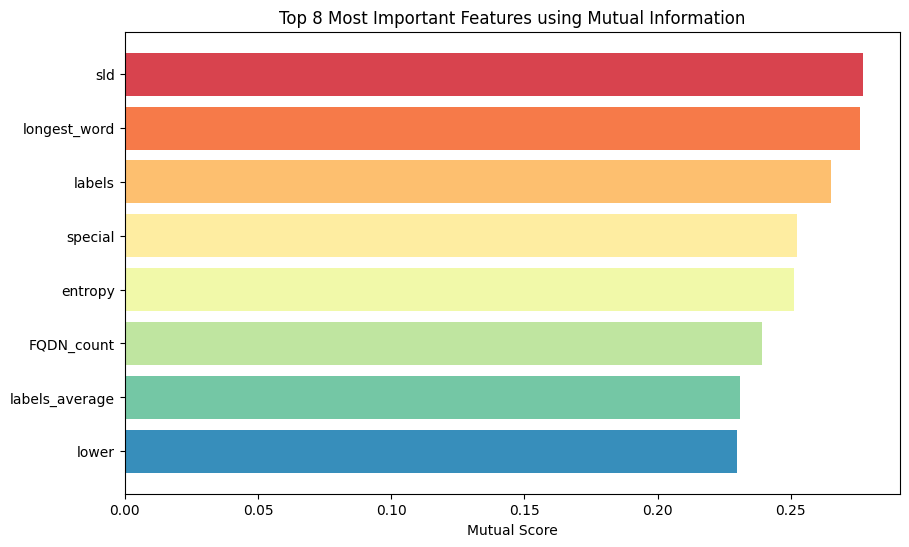

,Feature,Score
0,sld,0.277020
1,longest_word,0.275947
2,labels,0.265020
3,special,0.252440
4,entropy,0.251069
5,FQDN_count,0.239321
6,labels_average,0.230812
7,lower,0.229900


In [54]:
# Select the top k features based on Mutual Information scores
k_best = SelectKBest(mutual_info_classif, k='all')
k_best.fit(X, y)
feature_scores = k_best.scores_
selected_feature_names = X.columns[k_best.get_support()]

# Create a DataFrame combining feature names and their corresponding scores
feature_scores_df = pd.DataFrame({'Feature Name': selected_feature_names, 'Mutual Score': feature_scores})

# Sort the DataFrame based on 'Mutual_Score' column in descending order
sorted_feature_scores_df = feature_scores_df.sort_values(by='Mutual Score', ascending=False)
sorted_feature_scores_df

Top_features = sorted_feature_scores_df['Feature Name'].head(RF_mi_fs['best_i_f1'])
Top_scorces = sorted_feature_scores_df['Mutual Score'].head(RF_mi_fs['best_i_f1'])

# # Create a DataFrame with feature names and their corresponding scores
MI_top_feature_df = Feature_Selection(Top_features, Top_scorces, 'Mutual Information', 'Mutual Score')

MI_top_feature_df

In [55]:
features = MI_top_feature_df.sort_values(by='Feature')['Feature'].tolist()
features

['FQDN_count',
 'entropy',
 'labels',
 'labels_average',
 'longest_word',
 'lower',
 'sld',
 'special']

In [58]:
# Convert the NumPy array to a Pandas DataFrame
X_train_df = pd.DataFrame(X_train,columns=X.columns)
X_test_df = pd.DataFrame(X_test,columns=X.columns)


In [59]:
X_train_new=X_train_df[features]
X_train_new

,FQDN_count,entropy,labels,labels_average,longest_word,lower,sld,special
0,0.409953,-1.053277,0.785743,-0.403642,-0.538234,-0.192041,-0.582004,0.785105
1,0.886386,0.152411,0.785743,-0.284156,-0.540295,-0.192041,-0.583025,0.785105
2,0.568764,0.120247,0.785743,-0.363814,-0.540295,-0.192041,-0.583025,0.785105
3,0.886386,0.611857,0.785743,-0.284156,-0.540295,-0.192041,-0.583025,0.785105
4,0.886386,0.152411,0.785743,-0.284156,-0.540295,-0.192041,-0.583025,0.785105
...,...,...,...,...,...,...,...,...
141005,-1.178156,-0.445708,-0.822016,-0.204498,1.415619,0.388122,0.733915,-0.982238
141006,0.886386,0.152411,0.785743,-0.284156,-0.540295,-0.192041,-0.583025,0.785105
141007,-1.495778,-0.503744,-1.357936,0.153961,0.009505,-0.192041,0.073914,-0.982238
141008,0.568764,0.120247,0.785743,-0.363814,-0.540295,-0.192041,-0.583025,0.785105


In [60]:
X_test_new=X_test_df[features]
X_test_new

,FQDN_count,entropy,labels,labels_average,longest_word,lower,sld,special
0,-1.178156,0.484562,-0.822016,-0.204498,1.634851,0.388122,0.924430,-0.982238
1,-1.019345,0.656267,-1.357936,0.512420,0.294026,0.968284,1.103719,-1.424074
2,-0.384102,0.796862,-0.822016,0.193790,1.510459,1.838527,1.816112,-0.982238
3,0.886386,0.070654,0.785743,-0.284156,-0.540295,-0.192041,-0.583025,0.785105
4,0.886386,0.611857,0.785743,-0.284156,-0.540295,-0.192041,-0.583025,0.785105
...,...,...,...,...,...,...,...,...
35248,-1.178156,0.060044,-0.822016,-0.204498,-0.360923,0.388122,-0.492190,-0.982238
35249,0.409953,-1.053277,0.785743,-0.403642,-0.538234,-0.192041,-0.582004,0.785105
35250,0.409953,-1.053277,0.785743,-0.403642,-0.538234,-0.192041,-0.582004,0.785105
35251,0.727575,0.553819,0.785743,-0.323985,-0.540295,-0.192041,-0.583025,0.785105


#5.Model evaluation

##Helper Funtions

`tune_hyperparameters` function optimizes a specified classifier's performance by conducting a grid search with cross-validation using predefined hyperparameter grids. It identifies the best hyperparameters via 'f1' scoring, generates a new classifier instance with the best parameters, and returns it. This process enhances the model's accuracy and predictive capabilities based on the training data.

In [61]:
def tune_hyperparameters(X_train, y_train, classifier_name):
    # Define classifiers with their respective hyperparameter grids
    classifiers = {
        "Random Forest": (RandomForestClassifier(), {
            'n_estimators': [10, 50, 100, 200],
            'max_depth': [None, 10, 20, 30],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4]
        }),
        "Logistic Regression": (LogisticRegression(), {
            'C': [0.001, 0.01, 0.1, 1, 10, 100],
            'penalty': ['l1', 'l2'],
            'solver':['newton-cg', 'lbfgs', 'liblinear']
        }),
        "XGB Extreme X Gradient Boosting": (XGBClassifier(use_label_encoder=False), {
            'learning_rate': [0.01, 0.1, 0.2, 0.3],
            'n_estimators': [50, 100, 200],
            'max_depth': [3, 5, 7],
            'min_child_weight': [1, 3, 5],
            'subsample': [0.8, 1.0],
            'colsample_bytree': [0.8, 1.0]
        })
    }

    # Check if the provided classifier_name is in the dictionary
    if classifier_name not in classifiers:
        raise ValueError(f"Classifier {classifier_name} not found in the classifiers dictionary.")

    # Retrieve the classifier and its hyperparameter grid
    classifier, param_grid = classifiers[classifier_name]

    # Perform grid search with cross-validation
    grid_search = GridSearchCV(classifier, param_grid, cv=5, scoring='f1')
    grid_search.fit(X_train, y_train)

    # Print the best hyperparameters
    best_params = grid_search.best_params_
    print(f"Best hyperparameters for {classifier_name}: {best_params}")

    # Create a new classifier instance with the best parameters
    best_classifier = classifier.__class__(**best_params)

    return best_classifier

`Classifiers`function takes a model, training, and testing data along with a specified classifier name and performs model training, evaluation, and visualization tasks. It trains the given model on the specified feature-selected data using the Chi2 method and then evaluates its performance metrics. It displays confusion matrices, classification reports, ROC curves, and precision-recall curves for both training and testing datasets. Finally, it generates a performance curve plot based on the F1 score and the number of selected features for each classifier.

In [62]:
model_results={}
def Classifiers(classifier_name,model,X_train, X_test, y_train, y_test):

    print (classifier_name)
    print("------------------------------------------------------------------------------------------------------")

    print(f" Selected Features for {classifier_name} is{features} ")
    print("------------------------------------------------------------------------------------------------------")

    pastel_palette = sns.color_palette('pastel')
    classifiers_scorces = {}

    val_results = {}

    classifiers = ["Random Forest","Logistic Regression","XGB Extreme X Gradient Boosting"]

    for clf_name in classifiers:
        if (classifier_name == clf_name):

            clf_model = model.fit(X_train, y_train)

            y_train_pred = clf_model.predict(X_train)
            y_test_pred = clf_model.predict(X_test)
            model_results[clf_name]=f1_score(y_test, y_test_pred)*100
            ##############################################################################################################
            # Confusion Matrix for Training and Testing
            cm_train = confusion_matrix(y_train, y_train_pred)
            cm_test = confusion_matrix(y_test, y_test_pred)

            # Visualize the confusion matrices using Seaborn
            fig, axs = plt.subplots(ncols=2, figsize=(10, 5))

            sns.heatmap(cm_train, annot=True, cmap='Pastel2', ax=axs[0], fmt='g')
            axs[0].set_title(f"{clf_name} Training Confusion Matrix")
            axs[0].set_xlabel('Predicted Labels')
            axs[0].set_ylabel('Actual Labels')

            sns.heatmap(cm_test, annot=True, cmap='Pastel1', ax=axs[1], fmt='g')
            axs[1].set_title(f"{clf_name} Testing Confusion Matrix")
            axs[1].set_xlabel('Predicted Labels')
            axs[1].set_ylabel('Actual Labels')

            plt.tight_layout()
            plt.show()
            print("------------------------------------------------------------------------------------------------------")

            ##############################################################################################################
            # Classification Report for Training and Testing
            clf_report_train = classification_report(y_train, y_train_pred)
            print(f"{clf_name} Training Classification Report:\n{clf_report_train}")
            print("------------------------------------------------------------------------------------------------------")

            clf_report_test = classification_report(y_test, y_test_pred)
            print(f"{clf_name} Testing Classification Report:\n{clf_report_test}")
            print("------------------------------------------------------------------------------------------------------")

            ##############################################################################################################
            # ROC Curve
            fpr, tpr, _ = roc_curve(y_test, y_test_pred)
            roc_auc = auc(fpr, tpr)

            plt.figure(figsize=(8, 6))
            plt.plot(fpr, tpr, color='darkorange', lw=2, label=f'ROC curve (area = {roc_auc:.2f})')
            plt.plot([0, 1], [0, 1], color='navy', lw=2, linestyle='--')
            plt.xlabel('False Positive Rate')
            plt.ylabel('True Positive Rate')
            plt.title(f'{clf_name} ROC Curve')
            plt.legend(loc="lower right")
            plt.show()

            ##############################################################################################################
            # Precision-Recall Curve
            precision, recall, _ = precision_recall_curve(y_test, y_test_pred)

            plt.figure(figsize=(8, 6))
            plt.step(recall, precision, color='b', alpha=0.2, where='post')
            plt.fill_between(recall, precision, step='post', alpha=0.2, color='b')
            plt.xlabel('Recall')
            plt.ylabel('Precision')
            plt.title(f'{clf_name} Precision-Recall Curve')
            plt.show()

            ##############################################################################################################

            # Call the plot_performance_curve function
            if clf_name == 'Random Forest':
                evaluation_df = pd.DataFrame({
                    'Feature Selection Method': ['Chi2'],
                    'Number of Features': [len(features)],
                    'F1 score': model_results[clf_name]  # Update this with your actual F1 score
                    # Add other performance measures if needed
                })
            elif clf_name == 'Logistic Regression':
                evaluation_df = pd.DataFrame({
                    'Feature Selection Method': ['Chi2'],
                    'Number of Features': [len(features)],
                    'F1 score': model_results[clf_name]  # Update this with your actual F1 score
                    # Add other performance measures if needed
                })
            elif clf_name == 'XGB Extreme X Gradient Boosting':
                evaluation_df = pd.DataFrame({
                    'Feature Selection Method': ['Chi2'],
                    'Number of Features': [len(features)],
                    'F1 score':model_results[clf_name]  # Update this with your actual F1 score
                    # Add other performance measures if needed
                })

            plot_learning_curve(clf_model,X_train,y_train)
            return model_results

`plot_learning_curve` function visualizes the model's learning progress using different training set sizes. It plots the F1 score and loss values across varying amounts of training examples. It iterates through different sizes of the training set, calculates the F1 score and loss values using cross-validation, and finally displays these metrics on separate plots. This visualization helps in understanding how the model's performance changes with the amount of training data provided, assisting in assessing overfitting or underfitting tendencies.

In [63]:
def plot_learning_curve(classifier, X_train, y_train):
    # Plot learning curve
    plt.figure(figsize=(10, 5))

    # Define different training set sizes
    train_sizes = np.linspace(0.1, 1.0, 10)  # 10 different sizes from 10% to 100% of the dataset

    # Create scorer for F1 score
    f1_scorer = make_scorer(f1_score)

    # Calculate F1 score and loss values using cross_validate
    train_scores = []
    test_scores = []
    train_losses = []
    test_losses = []
    for size in train_sizes:
        train_set_size = int(size * len(X_train))
        X_subset, y_subset = X_train[:train_set_size], y_train[:train_set_size]

        scores = cross_validate(
            classifier, X_subset, y_subset, cv=5,
            scoring={'f1_score': f1_scorer, 'neg_log_loss': 'neg_log_loss'},
            return_train_score=True
        )
        train_scores.append(scores['train_f1_score'].mean())
        test_scores.append(scores['test_f1_score'].mean())
        train_losses.append(-scores['train_neg_log_loss'].mean())
        test_losses.append(-scores['test_neg_log_loss'].mean())

    # Plot F1 scores
    plt.subplot(1, 2, 1)
    plt.plot(train_sizes, train_scores, label='Train F1 Score')
    plt.plot(train_sizes, test_scores, label='Validation F1 Score')
    plt.title('F1 Score Learning Curve')
    plt.xlabel('Training Examples')
    plt.ylabel('F1 Score')
    plt.legend(loc='best')
    plt.grid(True)

    # Plot loss values
    plt.subplot(1, 2, 2)
    plt.plot(train_sizes, train_losses, label='Train Loss')
    plt.plot(train_sizes, test_losses, label='Validation Loss')
    plt.title('Loss Learning Curve')
    plt.xlabel('Training Examples')
    plt.ylabel('Loss')
    plt.legend(loc='best')
    plt.grid(True)

    plt.tight_layout()
    plt.show()


##Hyperparameter tuning

In [64]:
best_rf_parameters = tune_hyperparameters(X_train_new, y_train, 'Random Forest')
best_lr_parameters = tune_hyperparameters(X_train_new, y_train, "Logistic Regression")
best_xgb_parameters = tune_hyperparameters(X_train_new, y_train, "XGB Extreme X Gradient Boosting")

Best hyperparameters for Random Forest: {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}
Best hyperparameters for Logistic Regression: {'C': 0.1, 'penalty': 'l2', 'solver': 'newton-cg'}
Best hyperparameters for XGB Extreme X Gradient Boosting: {'colsample_bytree': 0.8, 'learning_rate': 0.3, 'max_depth': 5, 'min_child_weight': 1, 'n_estimators': 200, 'subsample': 1.0}


##Plot the performance metrics

Random Forest
------------------------------------------------------------------------------------------------------
 Selected Features for Random Forest is['FQDN_count', 'entropy', 'labels', 'labels_average', 'longest_word', 'lower', 'sld', 'special'] 
------------------------------------------------------------------------------------------------------


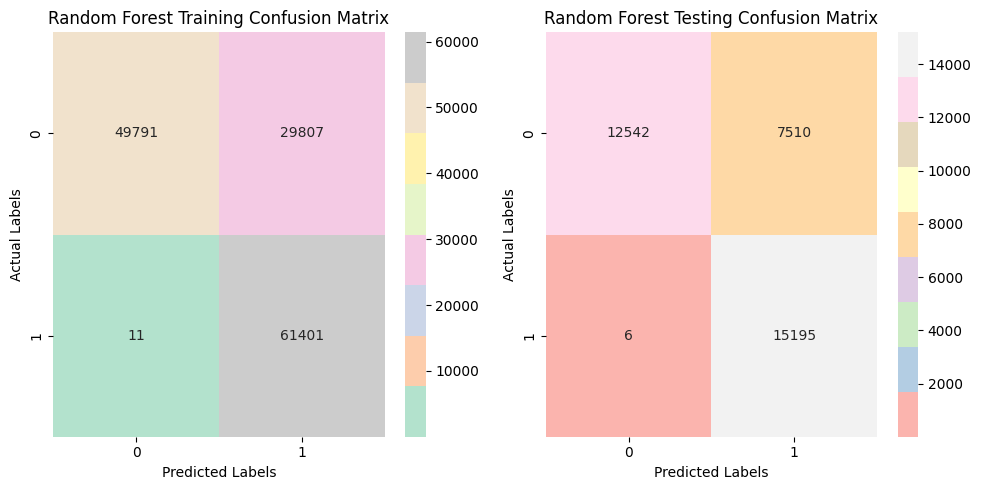

------------------------------------------------------------------------------------------------------
Random Forest Training Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.63      0.77     79598
           1       0.67      1.00      0.80     61412

    accuracy                           0.79    141010
   macro avg       0.84      0.81      0.79    141010
weighted avg       0.86      0.79      0.78    141010

------------------------------------------------------------------------------------------------------
Random Forest Testing Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.63      0.77     20052
           1       0.67      1.00      0.80     15201

    accuracy                           0.79     35253
   macro avg       0.83      0.81      0.79     35253
weighted avg       0.86      0.79      0.78     35253

-------------------------------------------------

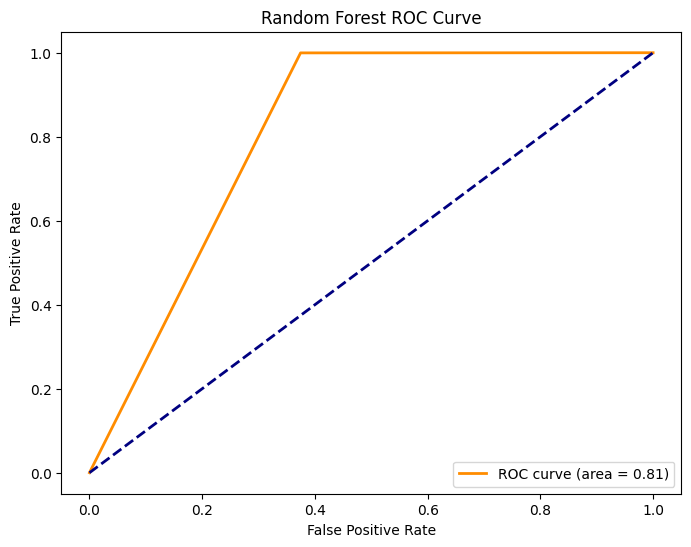

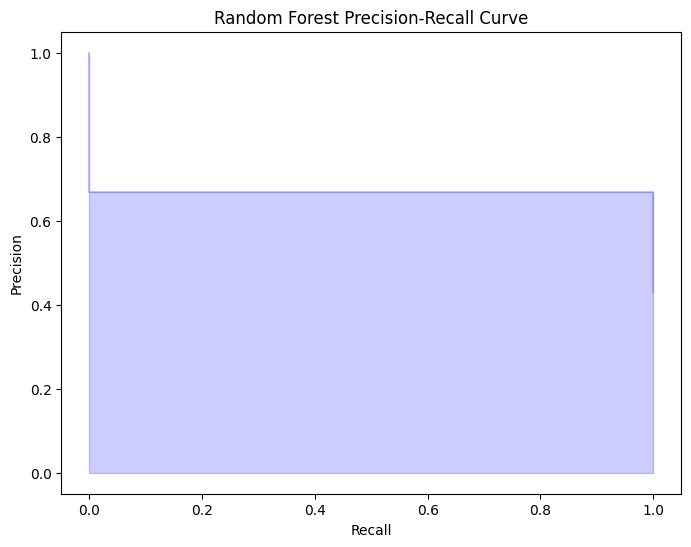

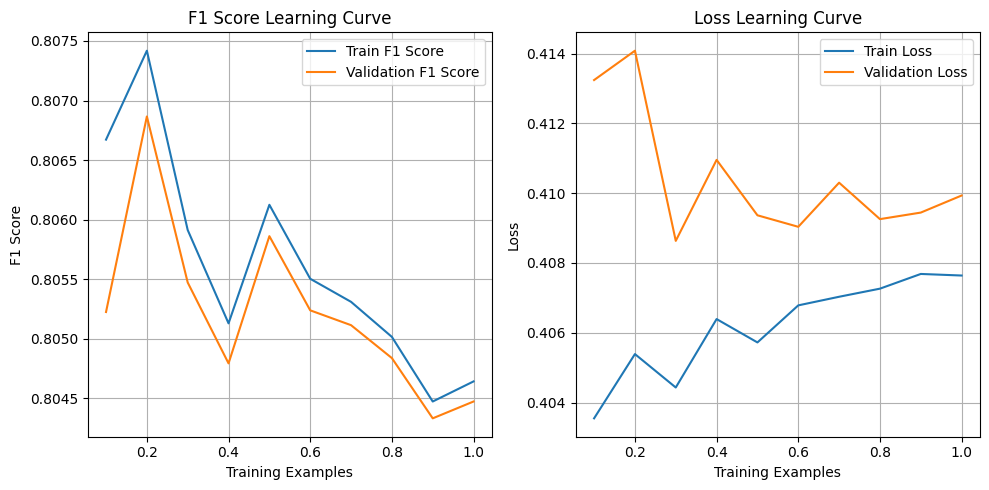

In [66]:
# Create the tuned RandomForestClassifier with the best parameters
model_results=Classifiers("Random Forest", best_rf_parameters, X_train_new, X_test_new, y_train, y_test)

Logistic Regression
------------------------------------------------------------------------------------------------------
 Selected Features for Logistic Regression is['FQDN_count', 'entropy', 'labels', 'labels_average', 'longest_word', 'lower', 'sld', 'special'] 
------------------------------------------------------------------------------------------------------


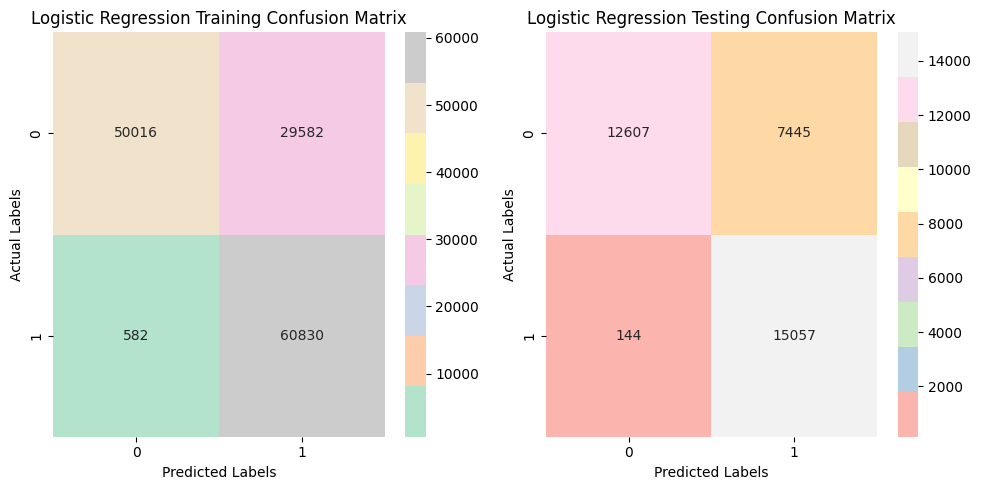

------------------------------------------------------------------------------------------------------
Logistic Regression Training Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.63      0.77     79598
           1       0.67      0.99      0.80     61412

    accuracy                           0.79    141010
   macro avg       0.83      0.81      0.78    141010
weighted avg       0.85      0.79      0.78    141010

------------------------------------------------------------------------------------------------------
Logistic Regression Testing Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.63      0.77     20052
           1       0.67      0.99      0.80     15201

    accuracy                           0.78     35253
   macro avg       0.83      0.81      0.78     35253
weighted avg       0.85      0.78      0.78     35253

-------------------------------------

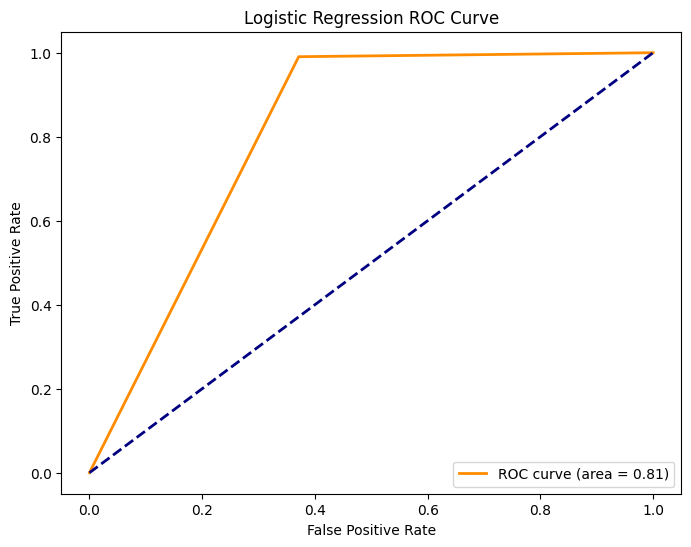

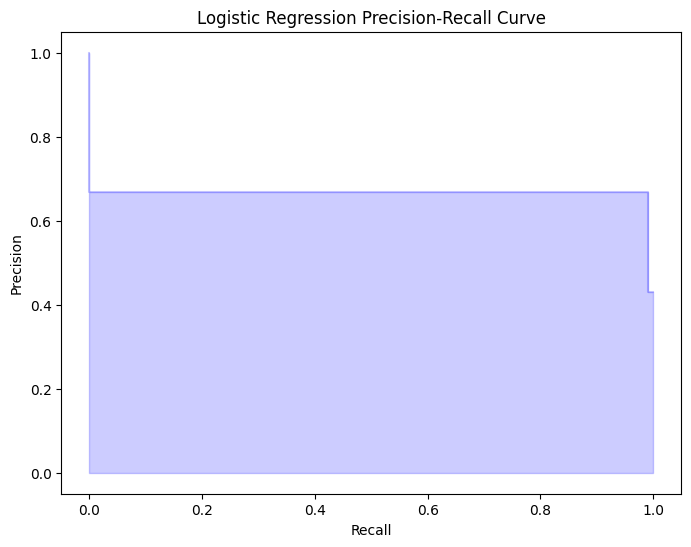

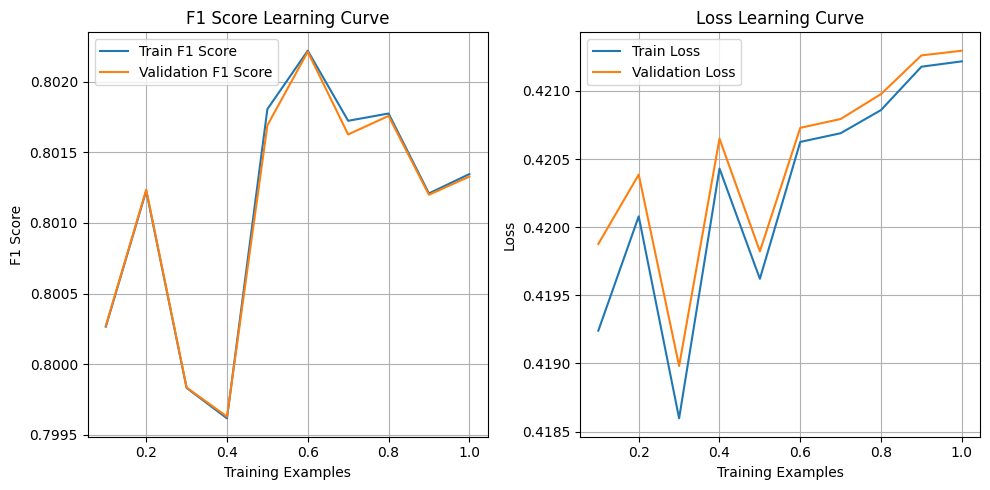

In [67]:
# Create the tuned LogisticRegression classifier with the best parameters
model_results=Classifiers("Logistic Regression", best_lr_parameters, X_train_new, X_test_new, y_train, y_test)

XGB Extreme X Gradient Boosting
------------------------------------------------------------------------------------------------------
 Selected Features for XGB Extreme X Gradient Boosting is['FQDN_count', 'entropy', 'labels', 'labels_average', 'longest_word', 'lower', 'sld', 'special'] 
------------------------------------------------------------------------------------------------------


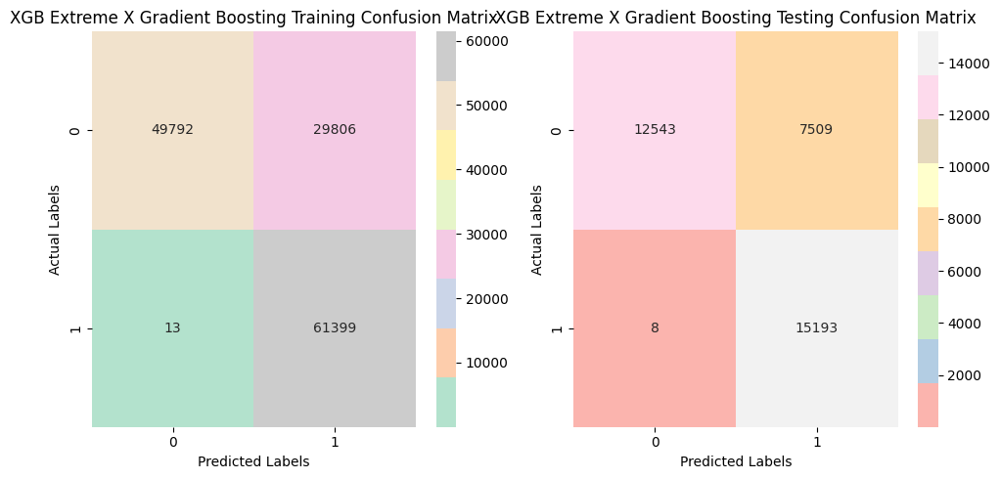

------------------------------------------------------------------------------------------------------
XGB Extreme X Gradient Boosting Training Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.63      0.77     79598
           1       0.67      1.00      0.80     61412

    accuracy                           0.79    141010
   macro avg       0.84      0.81      0.79    141010
weighted avg       0.86      0.79      0.78    141010

------------------------------------------------------------------------------------------------------
XGB Extreme X Gradient Boosting Testing Classification Report:
              precision    recall  f1-score   support

           0       1.00      0.63      0.77     20052
           1       0.67      1.00      0.80     15201

    accuracy                           0.79     35253
   macro avg       0.83      0.81      0.79     35253
weighted avg       0.86      0.79      0.78     35253

-------------

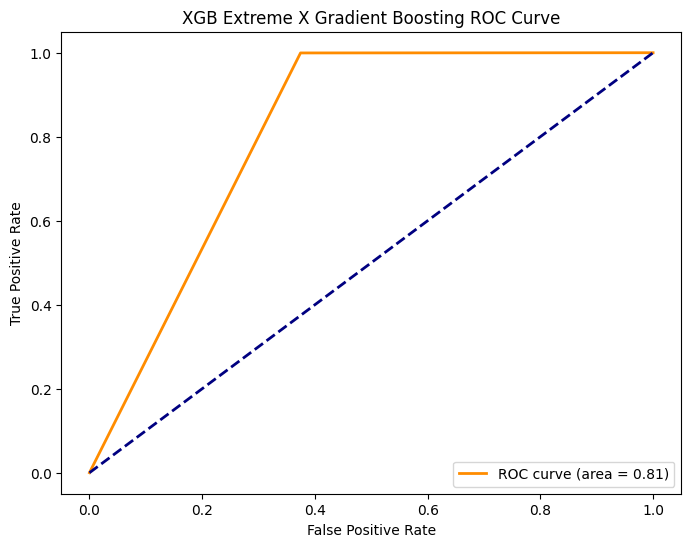

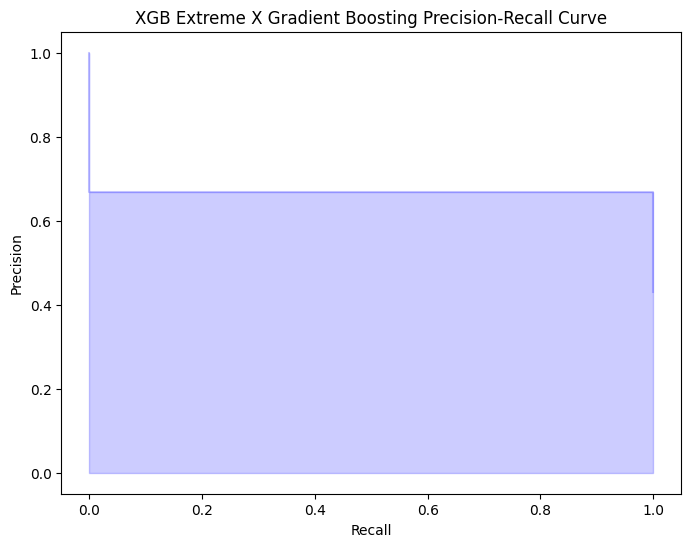

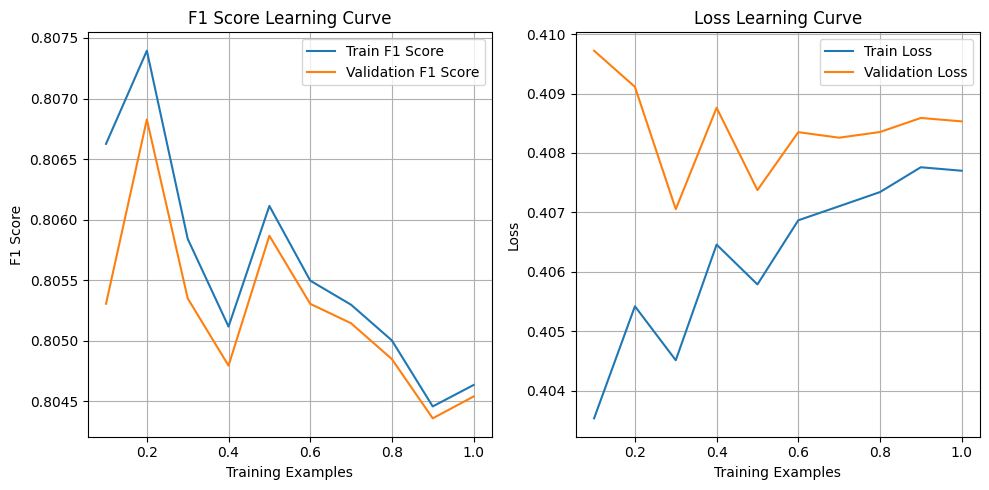

In [68]:
# Create the tuned XGBoost classifier with the best parameters
model_results=Classifiers("XGB Extreme X Gradient Boosting", best_xgb_parameters,X_train_new, X_test_new, y_train, y_test)

#Champion Static Model

In [69]:
print("Champion Model:")
best_classifier = max(model_results, key=model_results.get)
best_clf = model_results[best_classifier]
print(best_classifier, best_clf)

Champion Model:
Random Forest 80.17200443201604


In [70]:
sorted_Acc1 = sorted(model_results.items(), key=lambda x: x[1] * 100, reverse=True)
df = pd.DataFrame (sorted_Acc1, columns = ['Model','F1 score' ])
df.style.background_gradient(cmap='Blues')

,Model,F1 score
0,Random Forest,80.172004
1,XGB Extreme X Gradient Boosting,80.167797
2,Logistic Regression,79.871628


#Save Model

In [71]:

# Create the pipeline with feature selection followed by the Random Forest classifier
pipeline = Pipeline([
      ('Feature_Selection',features),
    ('Classifier', best_rf_parameters)
])


In [72]:
# Define the filename for the saved model
model_filename = 'StaticModel_Mutual_Info_rf_model.pkl'

# Save the fitted model using pickle
pickle.dump(pipeline, open(model_filename, 'wb'))
print(f"Model fitted and saved as {model_filename}")

# Load the saved model back into 'xx'
xx=pickle.load(open('StaticModel_Mutual_Info_rf_model.pkl', 'rb'))